In [57]:
from cplex_visualizer import visualize, visualizeOptimization, load_data_hyperparameter, visualizeResult, concat_str, countTrips, countRecharge
import matplotlib.ticker as ticker

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import os
filepath = r".\\MIP-"
saveFigDir = f"{filepath}Results/Figures/"

In [59]:
def visualizeOptimization(soln_filename, title):
    with open(soln_filename, "r") as f:
        content = f.readlines()
    gaps = []
    time = []
    i = 0
    diffs = []
    opt_gap_identifier = "Elapsed time = "
    timegap = -1
    initialize = "Log started (V22.1.1.0)"
    for idx, line in enumerate(content):
        lines = line.split()
        if line.startswith(initialize) or "22.1.1.0" in line:
            tempgaps = []
            temptime = []
            tempdiffs = []
            i = 0
        elif line.startswith("Total (root+branch&cut) ="):
            gaps.append(tempgaps)
            time.append(temptime)
            diffs.append(tempdiffs)
        elif line.startswith("The value of the objective function is (Total Cost): "):
            cost = line.split(" ")[-1]
            timegap = int(cost)
        if len(lines) > 2:
            if lines[-1].endswith("%"):
                i+=1
                gap = float(lines[-1].split("%")[0])
                tempgaps.append(gap)
            if (line.startswith(opt_gap_identifier) and "solutions = " in line) or (line.startswith("  Real time") and content[idx+1].startswith("  Sync time")):
                elapse_time = float(lines[3])
                temptime.append(float(elapse_time))
                if len(tempdiffs) > 0 and i > 0:
                    step = (elapse_time-temptime[-1])/i
                    tempdiffs += [x*step+temptime[-1] for x in range(i)]
                else:
                    step = elapse_time/(i+1) 
                    tempdiffs += [x*step for x in range(i)]
                i = 0

    
    test = pd.DataFrame({"time": diffs[0], "opt_gap": gaps[0]})
    ax = test.groupby('opt_gap')[['opt_gap', 'time']].last().sort_values(by=['time']).plot(x='time', y='opt_gap', xlabel="Time", ylabel="Opt Gap (%)", legend=False, title=title)
    fig = ax.get_figure()
    # fig.savefig(f"{saveFigDir}{title}-Optimality_Gap")
    return ax, timegap

def apply_custom_shift(group):
    dep_shift = group['dep_time'].shift(-1)
    arr_shift = group['arr_time'].shift(-1)
    trip_shift = group['trip_id'].shift(-1)
    group['next_dep'] = group.apply(
        lambda row: arr_shift[row.name] if trip_shift[row.name] != None and trip_shift[row.name].startswith('CS') else dep_shift[row.name],
        axis=1
    )
    return group

def custom_minmax_scaler(x, min_x, max_x):
    return (x - min_x) / (max_x - min_x)

In [34]:
def pareto_frontier(gaps, nbuses, title):
    norm_gaps = [custom_minmax_scaler(x, min(gaps), max(gaps)) for x in gaps]
    norm_nbuses = [custom_minmax_scaler(x, min(nbuses), max(nbuses)) for x in nbuses]

    test = pd.DataFrame({"NumBuses[#]": nbuses, "IdleTime(Gap)[sec]": gaps, "Norm_NBuses": norm_nbuses, "Norm_Gaps": norm_gaps})

    utopia = [min(nbuses), max(nbuses)]
    nadir = [min(gaps), max(gaps)]
    norm_ut = [0, 1]
    norm_na = [0, 1]
    misc = pd.DataFrame({'numBuses': utopia, 'Gaps': nadir, "norm_nBuses": norm_ut, "norm_gaps": norm_na})
    test['dist_min'] = test[['NumBuses[#]', 'IdleTime(Gap)[sec]']].apply(lambda x: np.sqrt((x['NumBuses[#]'] - misc.iloc[0]['numBuses'])**2 + (x['IdleTime(Gap)[sec]'] - misc.iloc[0]['Gaps'])**2), axis=1)
    test['dist_max'] = test[['NumBuses[#]', 'IdleTime(Gap)[sec]']].apply(lambda x: np.sqrt((x['NumBuses[#]'] - misc.iloc[1]['numBuses'])**2 + (x['IdleTime(Gap)[sec]'] - misc.iloc[1]['Gaps'])**2), axis=1)
    test['dist_norm_min'] = test[['Norm_NBuses', 'Norm_Gaps']].apply(lambda x: np.sqrt((x['Norm_NBuses'] - misc.iloc[0]['norm_nBuses'])**2 + (x['Norm_Gaps'] - misc.iloc[0]['norm_nBuses'])**2), axis=1)
    test['dist_norm_max'] = test[['Norm_NBuses', 'Norm_Gaps']].apply(lambda x: np.sqrt((x['Norm_NBuses'] - misc.iloc[1]['norm_gaps'])**2 + (x['Norm_Gaps'] - misc.iloc[1]['norm_gaps'])**2), axis=1)
    
    test['slope'] = np.gradient(test['Norm_NBuses'], test['Norm_Gaps'])
    test['slope'] = test['slope'].abs()
    test = test.fillna(method="ffill")
    print(f"SLOPE = \n{test.head()}")
    best = test.sort_values(by=['dist_norm_min', 'dist_norm_max'], ascending=[True, False]).iloc[0]
    ax = test.sort_values(by=['NumBuses[#]']).plot(
        x='Norm_NBuses', 
        y='Norm_Gaps', 
        xlabel="norm_numBuses", 
        ylabel="norm_IdleTime(Gap)[sec]", 
        legend=False,
        markersize=10,
        style=".-"
    )
    # Set integer x-axis ticks only
    # ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    misc[['norm_nBuses', 'norm_gaps']].plot(ax=ax, x='norm_nBuses', y='norm_gaps', style='x', markersize=12, color="red", legend=False, title=title)
    for idx, row in test.iterrows():
        ax.plot([misc.iloc[0, 2], row['Norm_NBuses']], 
               [misc.iloc[0, 3], row['Norm_Gaps']],
               'gray', linestyle=':')
        ax.plot([misc.iloc[1, 2], row['Norm_NBuses']], 
                [misc.iloc[1, 3], row['Norm_Gaps']],
                'black', linestyle=':')
        ax.text((misc.iloc[0, 2] + row['Norm_NBuses'])/2, (misc.iloc[0, 3] + row['Norm_Gaps'])/2, "{:.4f}".format(row['dist_norm_min']), fontsize=8)
        ax.text((misc.iloc[1, 2] + row['Norm_NBuses'])/2, (misc.iloc[1, 3] + row['Norm_Gaps'])/2, "{:.4f}".format(row['dist_norm_max']), fontsize=8)
    print(best['NumBuses[#]'])
    print(best['Norm_NBuses'])
    ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
    ax.text(best['Norm_NBuses'], best['Norm_Gaps']+0.1, "NumBuses: {:.0f} EBuses\nIdleTime {:.0f}minutes".format(best['NumBuses[#]'], best['IdleTime(Gap)[sec]']), fontsize=8, fontweight="bold")
    test.to_csv(f"{NTrips}T{NCS}CS.csv")
    ax.set_title(title)
    fig = ax.get_figure()
    fig.show()
    fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS_Best")
    return test

def find_best(norm):
    dx = np.gradient(norm['Norm_NBuses'])
    dy = np.gradient(norm['Norm_Gaps'])


    d2x = np.gradient(dx)
    d2y = np.gradient(dy)

    curvature = np.abs(d2x*dy - dx*d2y) / (dx**2 + dy**2)**1.5
    curvature
    return norm.iloc[np.argmax(curvature)]

{0: ['CA1', 'CS1', 'AC3', 'CS1', 'CA5', 'AC5'], 1: ['AC2', 'CA3'], 2: ['AC1'], 3: ['CA2', 'CA4', 'CS1', 'AC4']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['AC2', 'CA3'], 1: ['AC1'], 2: ['CA5', 'AC5'], 3: ['CA1', 'CS1', 'AC3'], 4: ['CA2', 'CA4', 'CS1', 'AC4']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['CA5', 'AC5'], 1: ['AC3'], 2: ['CA1', 'CA2'], 3: ['CA4', 'CS1', 'AC4'], 4: ['AC1'], 5: ['AC2', 'CA3']}


C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:66: PerformanceWarning: indexing past lexsort depth may impact performance.
  if (j,m) in schedule.index:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  if type(schedule.loc[(j,m), 'dep_time']) == np.int64:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:74: PerformanceWarning: indexing past lexsort depth may impact performance.
  xs = schedule.loc[(j,m), 'dep_time'].iloc[0]
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\C

cs!!! dur = 50
{0: ['AC4'], 1: ['AC2', 'CA3'], 2: ['CA5', 'AC5'], 3: ['CA4'], 4: ['AC1'], 5: ['CA1', 'CA2'], 6: ['AC3']}
{0: ['CA5', 'AC5'], 1: ['AC3'], 2: ['AC2'], 3: ['CA4'], 4: ['CA3'], 5: ['CA1', 'CA2'], 6: ['AC1'], 7: ['AC4']}
{0: ['AC5'], 1: ['CA3'], 2: ['CA5'], 3: ['AC3'], 4: ['AC2'], 5: ['CA1', 'CA2'], 6: ['AC1'], 7: ['AC4'], 8: ['CA4']}
{0: ['CA4'], 1: ['CA5'], 2: ['AC4'], 3: ['CA2'], 4: ['AC2'], 5: ['CA1'], 6: ['AC1'], 7: ['CA3'], 8: ['AC3'], 9: ['AC5']}
SLOPE = 
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0            4               405.0     0.000000   1.000000  405.000000   
1            5               300.0     0.166667   0.740741  300.001667   
2            6               205.0     0.333333   0.506173  205.009756   
3            7               110.0     0.500000   0.271605  110.040901   
4            8                65.0     0.666667   0.160494   65.122961   

     dist_max  dist_norm_min  dist_norm_max     slope  
0    6.000000       1

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


{0: ['AC2', 'CA3', 'CS2c', 'CA5', 'AC5'], 1: ['AC1', 'CS1a', 'AC3'], 2: ['CA1', 'CA2', 'CS2c', 'CA4', 'AC4']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
{0: ['AC1'], 1: ['AC2', 'CA3', 'CS2c', 'CA5', 'AC5'], 2: ['CA1', 'CA2', 'CS2c', 'CA4', 'AC4'], 3: ['AC3']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['AC1'], 1: ['AC3'], 2: ['AC2', 'CA3', 'CS2c', 'CA5', 'AC5'], 3: ['CA1', 'CA2', 'CS2c', 'CA4'], 4: ['AC4']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['AC3'], 1: ['CA3', 'CS2c', 'CA5', 'AC5'], 2: ['CA1', 'CA2', 'CS2c', 'CA4'], 3: ['AC4'], 4: ['AC2'], 5: ['AC1']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['CA1', 'CS2c', 'CA2'], 1: ['AC1'], 2: ['CA4'], 3: ['AC4'], 4: ['AC3'], 5: ['AC2'], 6: ['CA3', 'CA5', 'CS1a', 'AC5']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['AC1'], 1: ['CA3'], 2: ['CA5', 'AC5'], 3: ['AC2'], 4: ['AC4'], 5: ['AC3'], 6: ['CA4'], 7: ['CA1', 'CS2c', 'CA2']}
cs!!! dur = 50
{0: ['AC5'], 1: ['CA4'], 2: ['CA1', 'CA2'], 3: ['AC3'], 4: ['CA5'], 5: ['AC4'], 6: ['AC2'], 7: ['CA3'], 8: ['AC1']}
{0: ['CA4'], 1: [

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


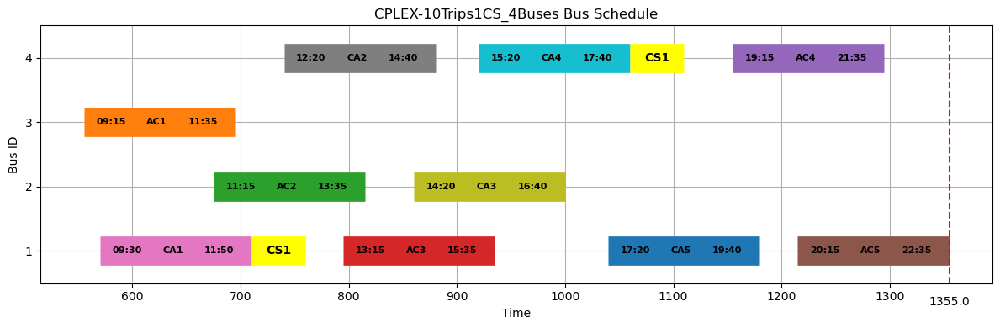

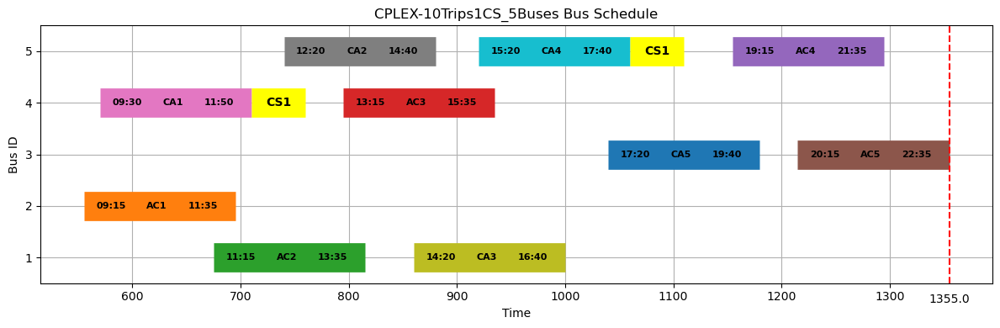

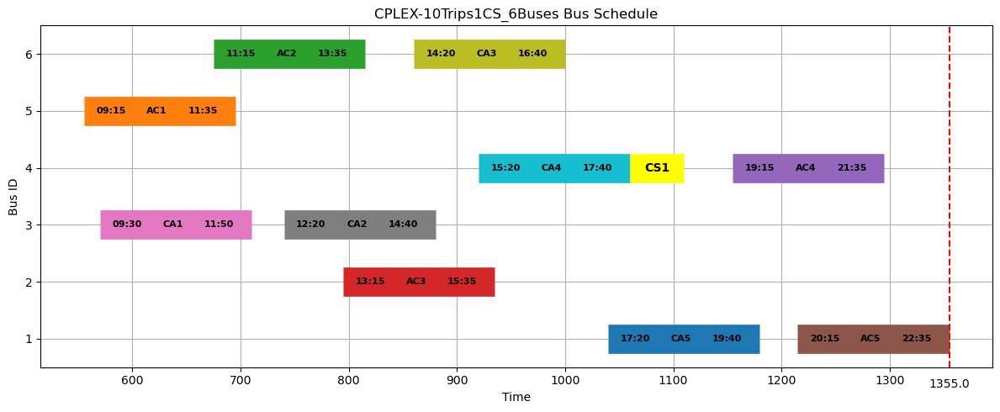

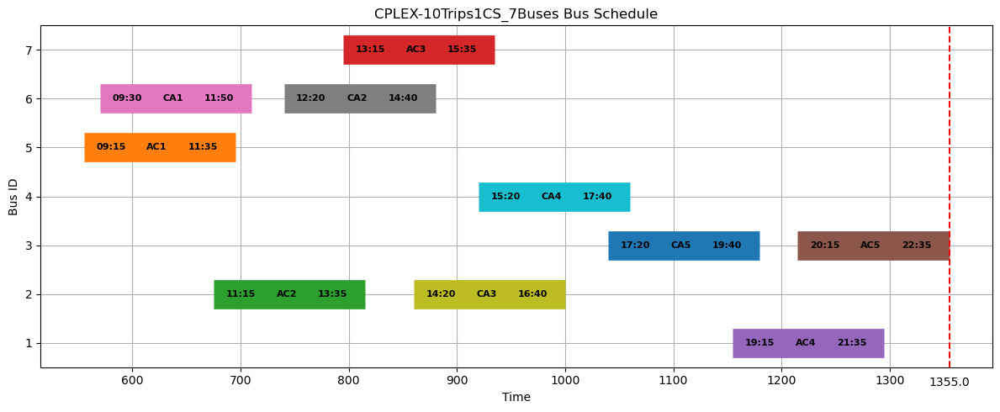

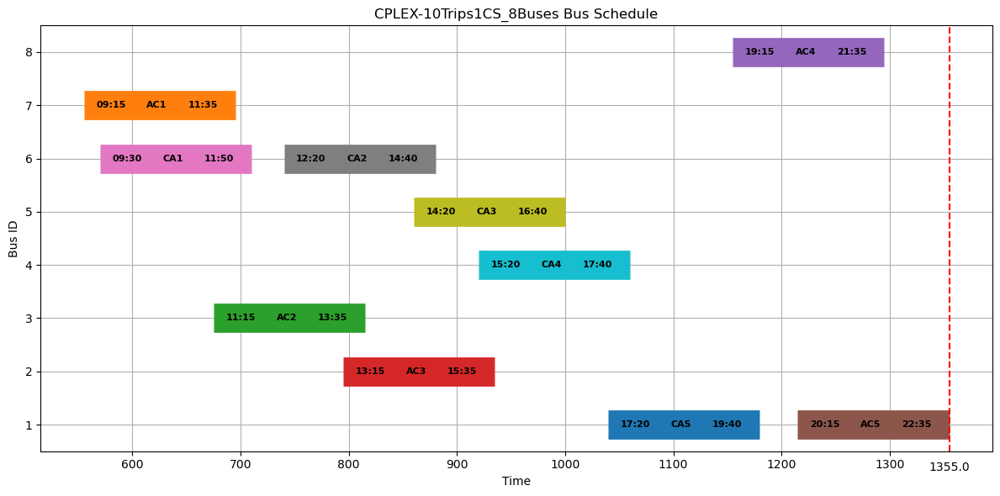

...

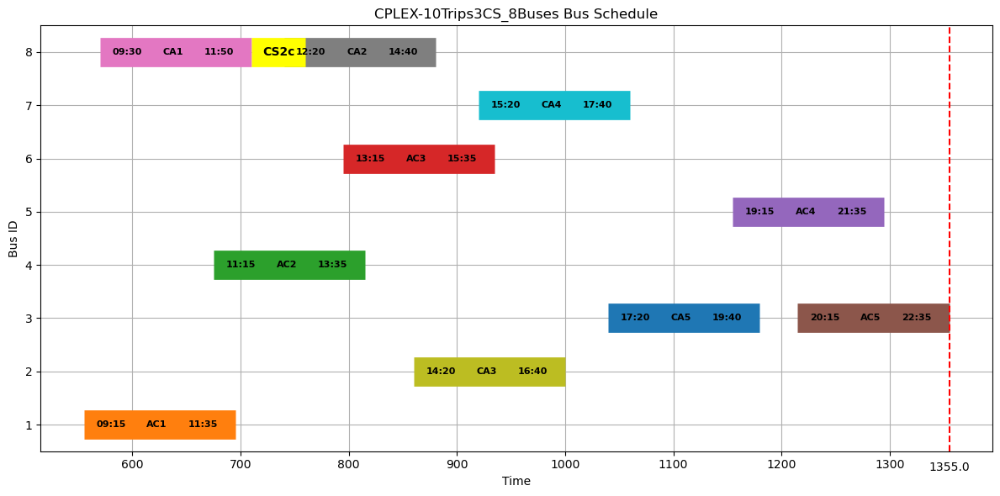

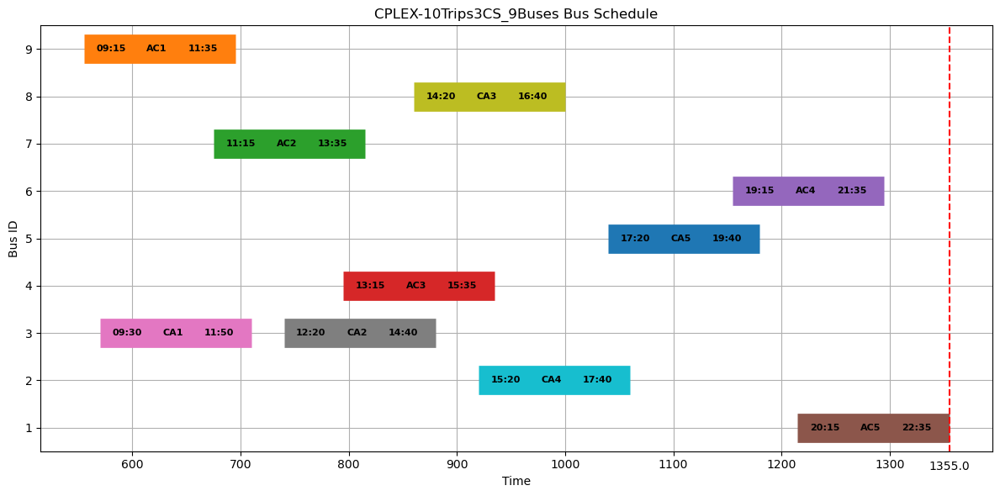

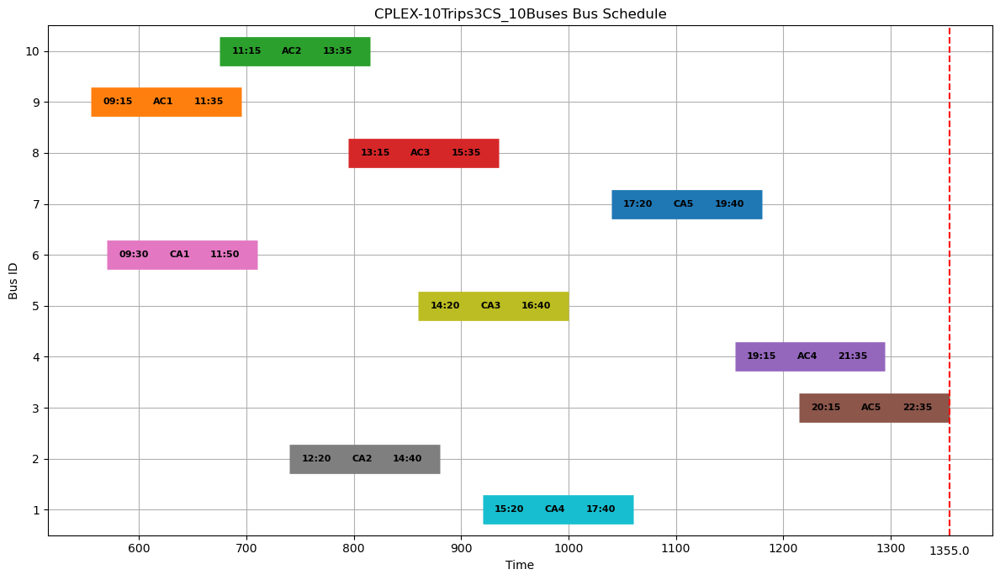

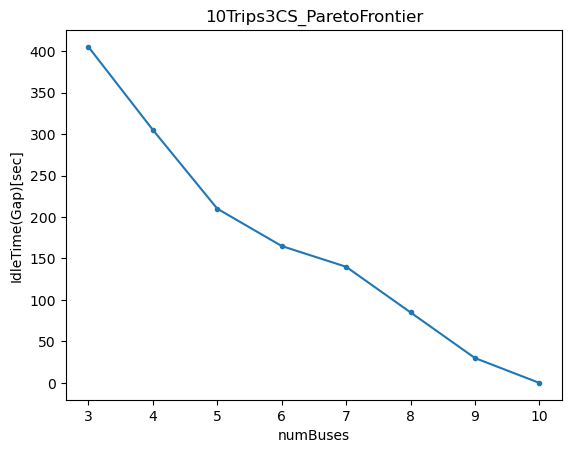

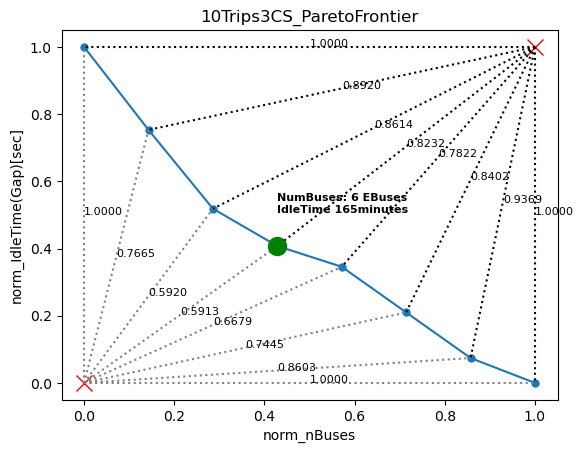

In [35]:
filename = f"{filepath}Data\\final_test.xlsx"
sheetname = "10Trips"

NTrips = 10 #trips
NTerms = 2 #terminals
NCS = 1 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
# print(filename)
df = pd.read_excel(filename, sheet_name="10Trips", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="10Trips", usecols="J:L", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="10Trips", usecols="B:L", skiprows=16, nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="10Trips", usecols="P:AA", skiprows=16, nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="10Trips", usecols="B:L", skiprows=30, nrows=(NTrips+DEPOT)*NCS)
# zeta = pd.read_excel(filename, sheet_name="10Trips", usecols="", skiprows=, nrows=()))
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()

C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
minBuses = 4
maxBuses = 11
cplex_pareto_10Trips1CS = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\10TripsEVeh1CS_{i}Buses.txt"
    title = f'CPLEX-10Trips1CS_{i}Buses'
    cplex_1cs_schedule, cplex_1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_10Trips1CS.append(cplex_1cs_schedule)

    #ax = visualizeOptimization(soln_filename, title)
cplex10T1CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex10T1CS_gap = []
cplex10T1CS_solns = []
for cplex_10T1CS in cplex_pareto_10Trips1CS:
    ###### 20Trips ##########
    cplex_10T1CS_df = cplex_10T1CS.groupby('bus_id', group_keys=False).apply(apply_custom_shift)
    cplex_10T1CS_df['next_dep'] = cplex_10T1CS_df['next_dep'].fillna(0)
    cplex_10T1CS_df['difference'] = cplex_10T1CS_df['next_dep'] - cplex_10T1CS_df['arr_time']
    cplex_10T1CS_df['difference'] = cplex_10T1CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_10T1CS_soln = cplex_10T1CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex10T1CS_solns.append(cplex_10T1CS_soln)
    cplex10T1CS_gap.append(cplex_10T1CS_soln['gapTime'].sum())
test = pd.DataFrame({"NumBuses[#]": cplex10T1CS_nbus, "IdleTime(Gap)[sec]": cplex10T1CS_gap})
title = "10Trips1CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex10T1CS_norm = pareto_frontier(cplex10T1CS_gap, cplex10T1CS_nbus, title)

NTrips = 10 #trips
NTerms = 2 #terminals
NCS = 3 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
# print(filename)
df = pd.read_excel(filename, sheet_name="10Trips", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="10Trips", usecols="J:L", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="10Trips", usecols="B:L", skiprows=16, nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="10Trips", usecols="P:AA", skiprows=16, nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="10Trips", usecols="B:L", skiprows=30, nrows=(NTrips+DEPOT)*NCS)
# zeta = pd.read_excel(filename, sheet_name="10Trips", usecols="", skiprows=, nrows=()))
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()

C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
minBuses = 3
maxBuses = 11
cplex_pareto_10Trips3CS = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\10TripsEVeh3CS_{i}Buses.txt"
    title = f'CPLEX-10Trips3CS_{i}Buses'
    cplex_3cs_schedule, cplex_3cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_10Trips3CS.append(cplex_3cs_schedule)

    #ax = visualizeOptimization(soln_filename, title)
cplex10T3CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex10T3CS_gap = []
cplex10T3CS_solns = []
for cplex_10T3CS in cplex_pareto_10Trips3CS:
    ###### 20Trips ##########
    cplex_10T3CS_df = cplex_10T3CS.groupby('bus_id', group_keys=False).apply(apply_custom_shift)
    cplex_10T3CS_df['next_dep'] = cplex_10T3CS_df['next_dep'].fillna(0)
    cplex_10T3CS_df['difference'] = cplex_10T3CS_df['next_dep'] - cplex_10T3CS_df['arr_time']
    cplex_10T3CS_df['difference'] = cplex_10T3CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_10T3CS_soln = cplex_10T3CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex10T3CS_solns.append(cplex_10T3CS_soln)
    cplex10T3CS_gap.append(cplex_10T3CS_soln['gapTime'].sum())

norm_gaps = [custom_minmax_scaler(x, min(cplex10T3CS_gap), max(cplex10T3CS_gap)) for x in cplex10T3CS_gap]
norm_nbuses = [custom_minmax_scaler(x, min(cplex10T3CS_nbus), max(cplex10T3CS_nbus)) for x in cplex10T3CS_nbus]

test = pd.DataFrame({"NumBuses[#]": cplex10T3CS_nbus, "IdleTime(Gap)[sec]": cplex10T3CS_gap, "Norm_NBuses": norm_nbuses, "Norm_Gaps": norm_gaps})
title = "10Trips3CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex10T3CS_norm = pareto_frontier(cplex10T3CS_gap, cplex10T3CS_nbus, title)

In [36]:
print(find_best(cplex10T1CS_norm))
print(find_best(cplex10T3CS_norm))

print(cplex10T1CS_norm)
print(cplex10T3CS_norm)

NumBuses[#]             8.000000
IdleTime(Gap)[sec]     65.000000
Norm_NBuses             0.666667
Norm_Gaps               0.160494
dist_min               65.122961
dist_max              340.005882
dist_norm_min           0.685713
dist_norm_max           0.903262
slope                   1.741071
Name: 4, dtype: float64
NumBuses[#]             6.000000
IdleTime(Gap)[sec]    165.000000
Norm_NBuses             0.428571
Norm_Gaps               0.407407
dist_min              165.027270
dist_max              240.033331
dist_norm_min           0.591316
dist_norm_max           0.823223
slope                   1.946939
Name: 3, dtype: float64
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0            4               405.0     0.000000   1.000000  405.000000   
1            5               300.0     0.166667   0.740741  300.001667   
2            6               205.0     0.333333   0.506173  205.009756   
3            7               110.0     0.500000   0.271605  11

{0: ['AC1', 'BA3'], 1: ['CA2', 'CA4', 'CS1', 'AC4'], 2: ['AB2', 'AB4'], 3: ['CA1', 'CS1', 'BA4', 'CS1', 'CA5', 'AC5'], 4: ['BA2', 'CA3'], 5: ['AB1', 'CS1', 'AB3', 'AB5'], 6: ['AC2', 'CS1', 'BA5'], 7: ['BA1', 'CS1', 'AC3']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50


C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:66: PerformanceWarning: indexing past lexsort depth may impact performance.
  if (j,m) in schedule.index:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  if type(schedule.loc[(j,m), 'dep_time']) == np.int64:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:74: PerformanceWarning: indexing past lexsort depth may impact performance.
  xs = schedule.loc[(j,m), 'dep_time'].iloc[0]
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\C

{0: ['CA2', 'BA5'], 1: ['AC1', 'CS1', 'AC3'], 2: ['CA1', 'CS1', 'AB3', 'AB5'], 3: ['AB2', 'AB4'], 4: ['CA4', 'AC4'], 5: ['AC2', 'CA3'], 6: ['BA1'], 7: ['AB1', 'BA3'], 8: ['BA2', 'BA4', 'CS1', 'CA5', 'AC5']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
{0: ['BA2', 'BA4', 'CS1', 'CA5', 'AC5'], 1: ['CA2', 'AB4'], 2: ['BA1'], 3: ['CA1', 'AC3'], 4: ['AB1'], 5: ['AB3', 'AB5'], 6: ['AC1', 'BA3'], 7: ['AC2', 'CA3'], 8: ['CA4', 'CS1', 'AC4'], 9: ['AB2', 'BA5']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['AB3', 'AB5'], 1: ['BA4', 'CS1', 'CA5', 'AC5'], 2: ['CA4', 'CS1', 'AC4'], 3: ['BA1'], 4: ['BA2', 'AC3'], 5: ['CA1', 'AB2'], 6: ['CA2', 'BA5'], 7: ['AC2', 'CA3'], 8: ['AB1'], 9: ['AB4'], 10: ['AC1', 'BA3']}
cs!!! dur = 50
cs!!! dur = 50
{0: ['AB4'], 1: ['BA2', 'AC3'], 2: ['AC1', 'BA3'], 3: ['BA4', 'AB5'], 4: ['CA4', 'AC4'], 5: ['AB1'], 6: ['CA3'], 7: ['BA1'], 8: ['CA1', 'AB2'], 9: ['AC2', 'AB3'], 10: ['CA2', 'BA5'], 11: ['CA5', 'AC5']}
{0: ['CA1', 'AB2'], 1: ['BA2', 'AC3'], 2: ['AC2', 'AB3'], 3: ['AB1', 

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


{0: ['BA2', 'CS1a', 'AB3', 'AB5'], 1: ['CA1', 'CS1a', 'AC3'], 2: ['AB1', 'BA4', 'CS1', 'CA5', 'AC5'], 3: ['BA1', 'CS1a', 'AB2', 'BA5'], 4: ['AC1', 'BA3', 'CS1a', 'AB4'], 5: ['AC2', 'CA3'], 6: ['CA2', 'CA4', 'CS1', 'AC4']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
{0: ['AB3', 'AB5'], 1: ['CA1', 'BA4', 'CS1', 'CA5', 'AC5'], 2: ['AC1'], 3: ['BA1', 'CS1a', 'AB2', 'BA5'], 4: ['BA2', 'AC3'], 5: ['AB1', 'BA3', 'CS1a', 'AB4'], 6: ['CA2', 'CA4', 'CS1a', 'AC4'], 7: ['AC2', 'CA3']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
{0: ['CA1', 'CA2'], 1: ['CA4', 'AC4'], 2: ['AC2', 'AB3'], 3: ['AC1', 'BA3', 'CS1a', 'AB4'], 4: ['BA1', 'CS1a', 'AB2', 'BA5'], 5: ['CA3', 'CA5'], 6: ['BA2', 'AC3'], 7: ['AB1'], 8: ['BA4', 'AB5', 'CS1a', 'AC5']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
{0: ['AB1', 'BA3', 'CS1a', 'AB4'], 1: ['AC2', 'AB3'], 2: ['BA4', 'AB5'], 3: ['CA3'], 4: ['AC1'], 5: ['BA2', 'AC3'], 6: ['CA5', 'AC5'], 7: ['CA1', 'CA2'], 8: ['BA

C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(12, int(len(buses)/2) + 2)) if len(trips) < 30 else plt.subplots(1,1, figsize=(12, len(buses)-3)) if len(trips) < 40 else plt.subplots(1,1, figsize=(14, len(buses)-6))


SLOPE = 
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0            7               770.0     0.000000   1.000000  580.000000   
1            8               635.0     0.166667   0.767241  445.001124   
2            9               525.0     0.333333   0.577586  335.005970   
3           10               420.0     0.500000   0.396552  230.019564   
4           11               325.0     0.666667   0.232759  135.059246   

     dist_max  dist_norm_min  dist_norm_max     slope  
0    6.000000       1.000000       1.000000  0.716049  
1  135.092561       0.785135       0.865229  0.805722  
2  245.032651       0.666871       0.789226  0.900198  
3  350.012857       0.638164       0.783677  0.971512  
4  445.004494       0.706131       0.836523  1.226779  
10.0
0.5


C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


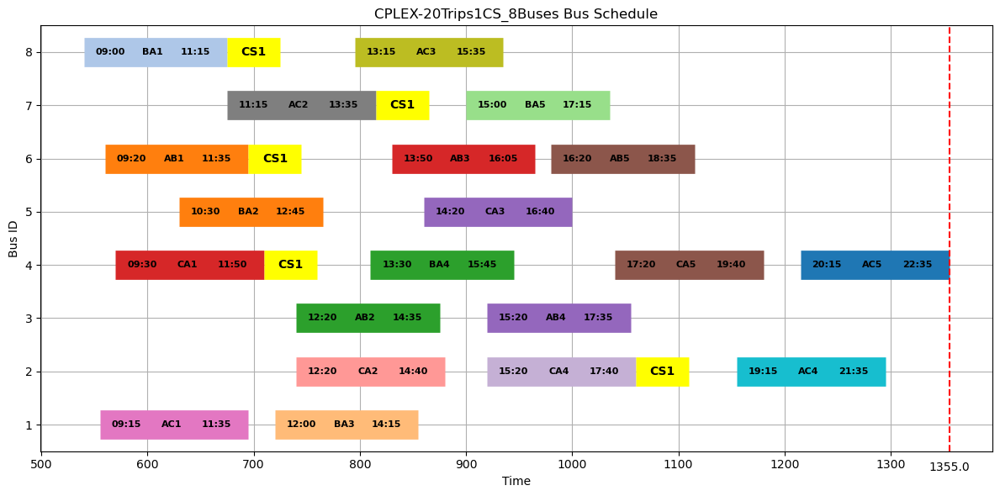

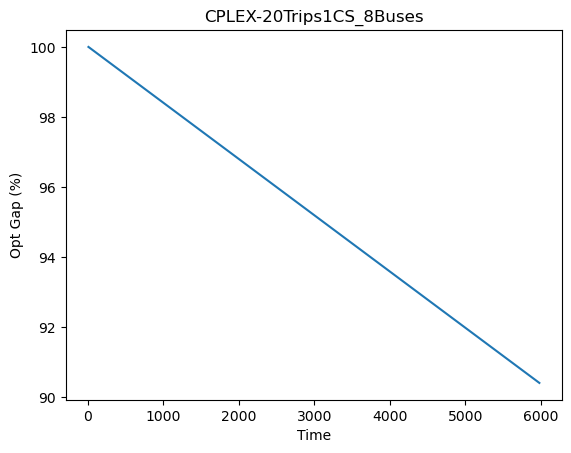

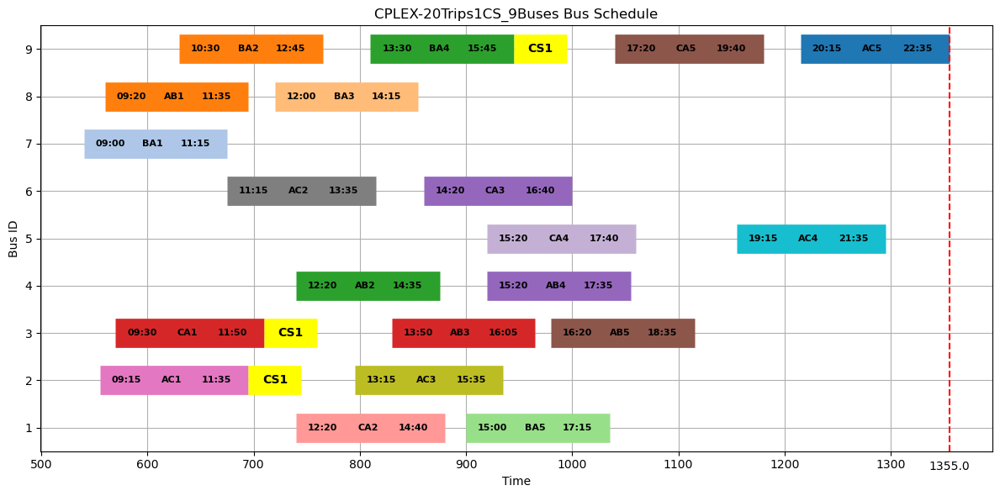

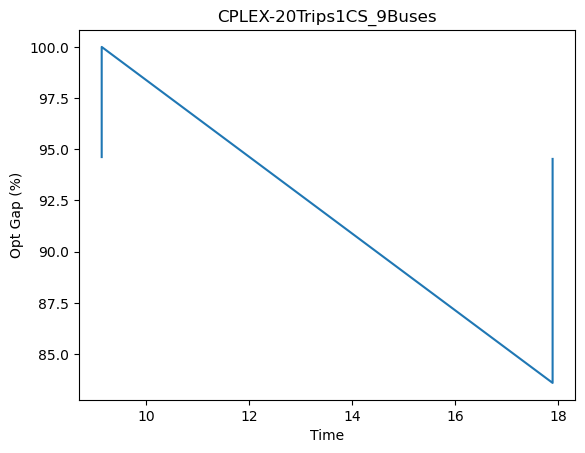

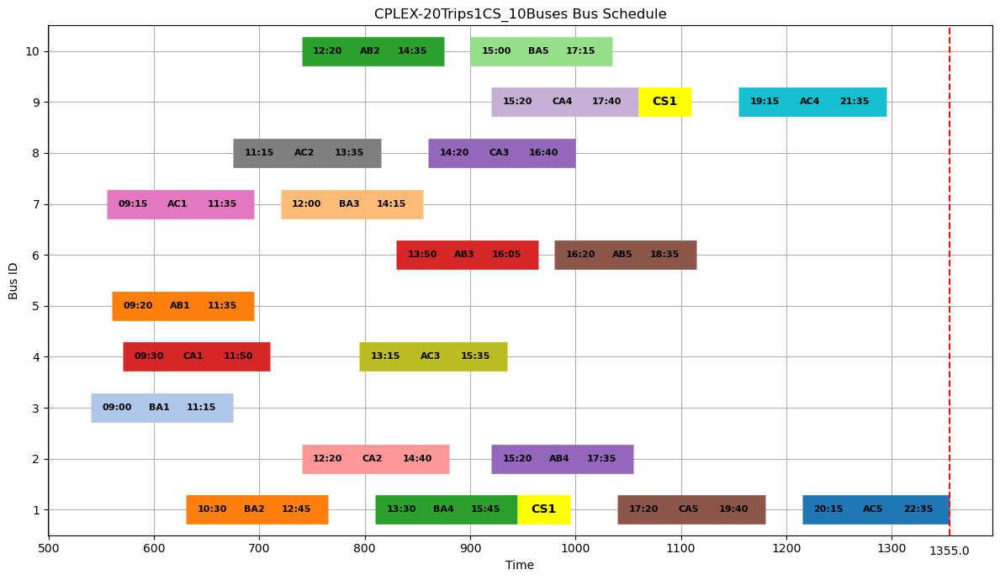

...

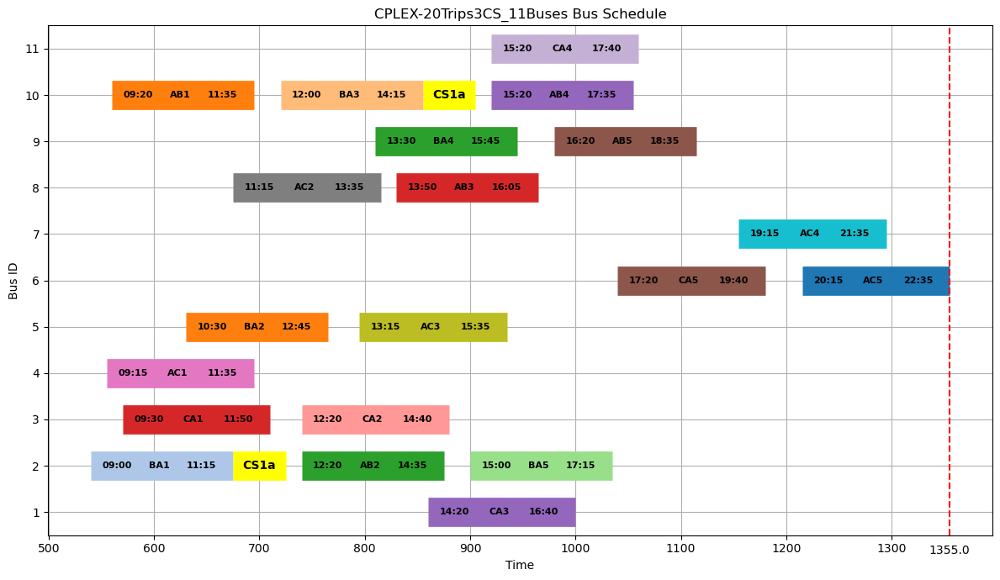

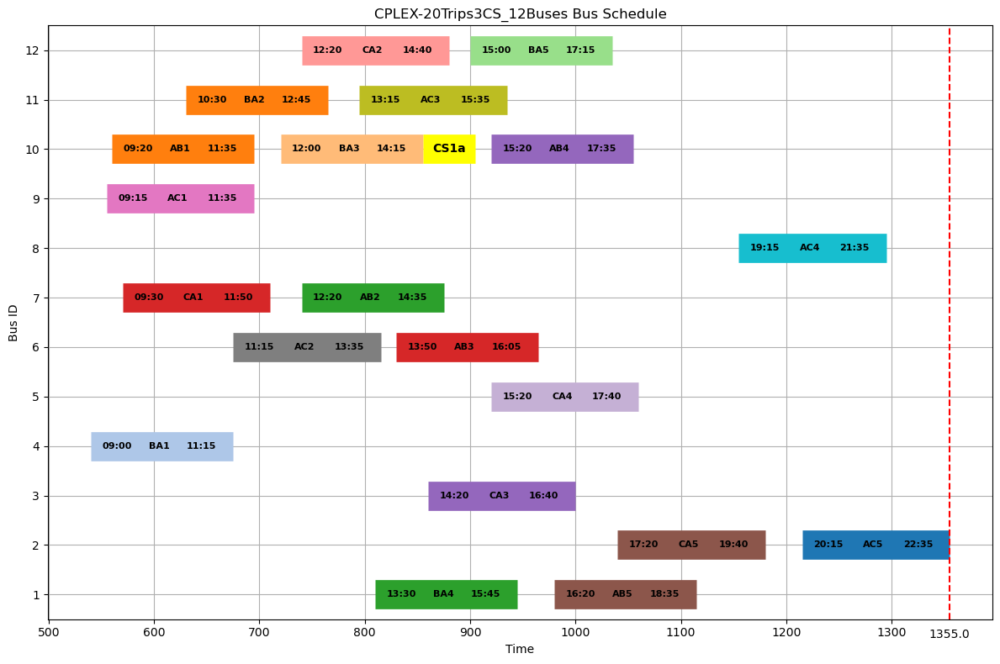

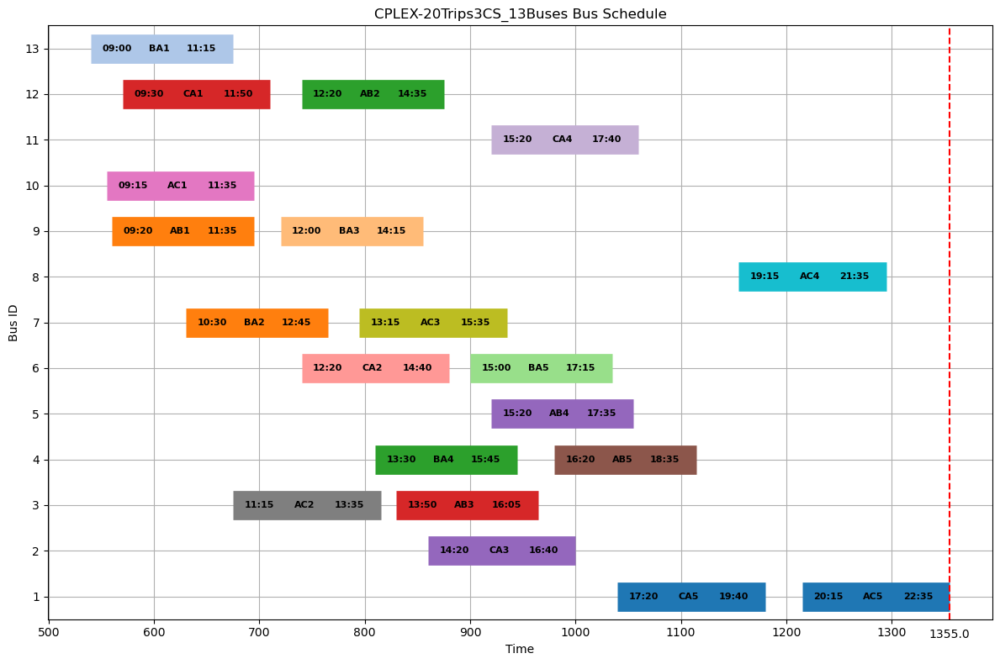

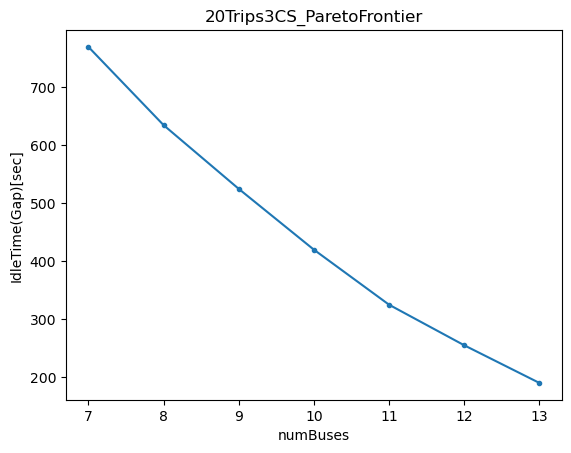

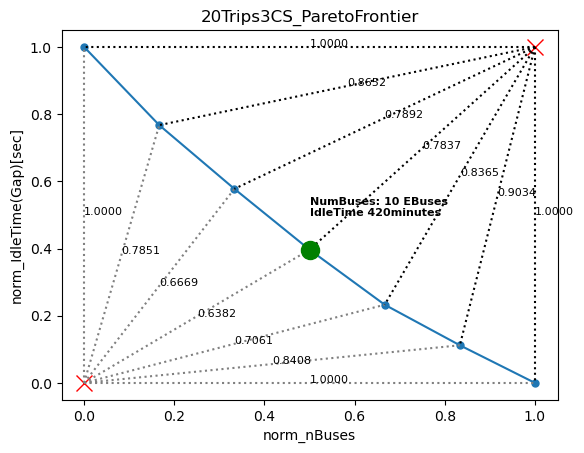

In [37]:
############################################### 20 TRIPS Single CS ###########################################
filepath = r".\\MIP-"
filename = f"{filepath}Data\\data_20_40trips.xlsx"
sheetname = "20Trips"

NTrips = 20 #trips
NTerms = 2 #terminals
NCS = 1 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
# print(filename)
df = pd.read_excel(filename, sheet_name="20Trips", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="20Trips", usecols="AB:AD", skiprows=31, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="feasible_mat", usecols="B:V", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="duration_mat", usecols="B:W", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="Recharged_Feasible_matv3", usecols="C:W", nrows=(NTrips+DEPOT)*NCS)
# zeta = pd.read_excel(filename, sheet_name="10Trips", usecols="", skiprows=, nrows=()))
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()

C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
# # soln_filename = f"{filepath}cplex_results\\10TripsEVeh1CS_Eq1.txt"
# soln_filename = f"{filepath}Results\\TimeLimit\\1May25\\20TripsEVeh1CS_Eq1.txt"
# title = 'CPLEX-20Trips1CS'
# cplex_20Trips1cs_schedule, cplex_20Trips1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# soln_filename = f"{filepath}Results\\HPC\\RB_20T1CS.asc"
# title = 'CPLEX-20Trips1CS_HPC'
# cplex_20Trips1cs_schedule_OPT, cplex_20Trips1cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 8
maxBuses = 14
cplex_pareto_20Trips1CS = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\20TripsEVeh1CS_{i}Buses.txt"
    title = f'CPLEX-20Trips1CS_{i}Buses'
    cplex_1cs_schedule, cplex_1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_20Trips1CS.append(cplex_1cs_schedule)

    ax = visualizeOptimization(soln_filename, title)

cplex20T1CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex20T1CS_gap = []
cplex20T1CS_solns = []
for cplex_20T1CS in cplex_pareto_20Trips1CS:
    ###### 20Trips ##########
    # cplex_10T1CS_df = cplex_10T1CS.copy(deep=True)
    cplex_20T1CS_df = cplex_20T1CS.groupby('bus_id', group_keys=False).apply(apply_custom_shift)
    cplex_20T1CS_df['next_dep'] = cplex_20T1CS_df['next_dep'].fillna(0)
    cplex_20T1CS_df['difference'] = cplex_20T1CS_df['next_dep'] - cplex_20T1CS_df['arr_time']
    cplex_20T1CS_df['difference'] = cplex_20T1CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_20T1CS_soln = cplex_20T1CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex20T1CS_solns.append(cplex_20T1CS_soln)
    cplex20T1CS_gap.append(cplex_20T1CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex20T1CS_nbus, "IdleTime(Gap)[sec]": cplex20T1CS_gap})
title = f"20Trips1CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex20T1CS_norm = pareto_frontier(cplex20T1CS_gap, cplex20T1CS_nbus, title)

############################################### 20 TRIPS MULTIPLE CSs ###########################################
NTrips = 20 #trips
NTerms = 2 #terminals
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
NCS = 3 #recharging stations
df = pd.read_excel(filename, sheet_name="20Trips", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="20Trips", usecols="AB:AD", skiprows=31, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="feasible_mat", usecols="B:V", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="duration_mat", usecols="B:Y", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="Recharged_Feasible_matv3", usecols="C:W", nrows=(NTrips+DEPOT)*NCS)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()

# soln_filename = f"{filepath}Results\\TimeLimit\\1May25\\20TripsEVeh3CS_Eq1.txt"
# title = 'CPLEX-20Trips3CS'
# cplex_20Trips3cs_schedule, cplex_20Trips3cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# soln_filename = f"{filepath}Results\\HPC\\RB_20T3CS.asc"
# title = 'CPLEX-20Trips3CS_HPC'
# cplex_20Trips3cs_schedule_OPT, cplex_20Trips3cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 7
maxBuses = 14
cplex_pareto_20Trips3CS = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\20TripsEVeh3CS_{i}Buses.txt"
    title = f'CPLEX-20Trips3CS_{i}Buses'
    cplex_3CS_schedule, cplex_3CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_20Trips3CS.append(cplex_3CS_schedule)

    #ax = visualizeOptimization(soln_filename, title)

cplex20T3CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex20T3CS_gap = []
cplex20T3CS_solns = []
for cplex_20T3CS in cplex_pareto_20Trips3CS:
    ###### 20Trips ##########
    # cplex_10T1CS_df = cplex_10T1CS.copy(deep=True)
    cplex_20T3CS_df = cplex_20T3CS.groupby('bus_id', group_keys=False).apply(apply_custom_shift)
    cplex_20T3CS_df['next_dep'] = cplex_20T3CS_df['next_dep'].fillna(0)
    cplex_20T3CS_df['difference'] = cplex_20T3CS_df['next_dep'] - cplex_20T3CS_df['arr_time']
    cplex_20T3CS_df['difference'] = cplex_20T3CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_20T3CS_soln = cplex_20T3CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex20T3CS_solns.append(cplex_20T3CS_soln)
    cplex20T3CS_gap.append(cplex_20T3CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex20T3CS_nbus, "IdleTime(Gap)[sec]": cplex20T3CS_gap})
title = f"20Trips3CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex20T3CS_norm = pareto_frontier(cplex20T3CS_gap, cplex20T3CS_nbus, title)

In [38]:
print(find_best(cplex20T1CS_norm))
print(find_best(cplex20T3CS_norm))


print(cplex20T1CS_norm)
print(cplex20T3CS_norm)

NumBuses[#]            10.000000
IdleTime(Gap)[sec]    505.000000
Norm_NBuses             0.400000
Norm_Gaps               0.453237
dist_min              315.006349
dist_max              380.011842
dist_norm_min           0.604503
dist_norm_max           0.811757
slope                   1.126325
Name: 2, dtype: float64
NumBuses[#]            11.000000
IdleTime(Gap)[sec]    325.000000
Norm_NBuses             0.666667
Norm_Gaps               0.232759
dist_min              135.059246
dist_max              445.004494
dist_norm_min           0.706131
dist_norm_max           0.836523
slope                   1.226779
Name: 4, dtype: float64
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0            8               885.0          0.0   1.000000  695.000000   
1            9               640.0          0.2   0.647482  450.001111   
2           10               505.0          0.4   0.453237  315.006349   
3           11               390.0          0.6   0.287770  20

{'0': ['AC2', 'AB3'], '1': ['AD1', 'DA1', 'AB7'], '2': ['BA2', 'CS1', 'CA3', 'CA5'], '3': ['AB2', 'BA5'], '4': ['CD1', 'CS1', 'CA4', 'BA7'], '5': ['CA2', 'AB4', 'CS1', 'BA8'], '6': ['CA1', 'CS1', 'AC3', 'CS1', 'AB6', 'AB8'], '7': ['AB1', 'BA3', 'CS1', 'BA6', 'AC4'], '8': ['BA1', 'DC1', 'AC5'], '9': ['AC1', 'CS1', 'BA4', 'AB5']}
{'0': ['AC2', 'AB3'], '1': ['AD1', 'DA1', 'AB7'], '2': ['BA2', 'CS1', 'CA3', 'CA5'], '3': ['AB2', 'BA5'], '4': ['CD1', 'CS1', 'CA4', 'BA7'], '5': ['CA2', 'AB4', 'CS1', 'BA8'], '6': ['CA1', 'CS1', 'AC3', 'CS1', 'AB6', 'AB8'], '7': ['AB1', 'BA3', 'CS1', 'BA6', 'AC4'], '8': ['BA1', 'DC1', 'AC5'], '9': ['AC1', 'CS1', 'BA4', 'AB5']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50


C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:66: PerformanceWarning: indexing past lexsort depth may impact performance.
  if (j,m) in schedule.index:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  if type(schedule.loc[(j,m), 'dep_time']) == np.int64:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:74: PerformanceWarning: indexing past lexsort depth may impact performance.
  xs = schedule.loc[(j,m), 'dep_time'].iloc[0]
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\C

{'0': ['CA1', 'CS1', 'AC3', 'AB5', 'CS1', 'AC5'], '1': ['CA3', 'CA5'], '10': ['AC2', 'AB3'], '2': ['AB1', 'CA2', 'CS1', 'BA6', 'BA8'], '3': ['AC1', 'BA3'], '4': ['BA1', 'DC1', 'AC4'], '5': ['CD1', 'CS1', 'CA4', 'BA7'], '6': ['AB4'], '7': ['BA2', 'BA4', 'CS1', 'AB6', 'AB8'], '8': ['AB2', 'BA5'], '9': ['AD1', 'DA1', 'AB7']}
{'0': ['CA1', 'CS1', 'AC3', 'AB5', 'CS1', 'AC5'], '1': ['CA3', 'CA5'], '10': ['AC2', 'AB3'], '2': ['AB1', 'CA2', 'CS1', 'BA6', 'BA8'], '3': ['AC1', 'BA3'], '4': ['BA1', 'DC1', 'AC4'], '5': ['CD1', 'CS1', 'CA4', 'BA7'], '6': ['AB4'], '7': ['BA2', 'BA4', 'CS1', 'AB6', 'AB8'], '8': ['AB2', 'BA5'], '9': ['AD1', 'DA1', 'AB7']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50


C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:66: PerformanceWarning: indexing past lexsort depth may impact performance.
  if (j,m) in schedule.index:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  if type(schedule.loc[(j,m), 'dep_time']) == np.int64:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:74: PerformanceWarning: indexing past lexsort depth may impact performance.
  xs = schedule.loc[(j,m), 'dep_time'].iloc[0]
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\C

{'0': ['AB4'], '1': ['AB3', 'AB5'], '10': ['CA1', 'AB2'], '11': ['AC2', 'CA3'], '2': ['BA1', 'DC1', 'AC4'], '3': ['AC1', 'BA3'], '4': ['CA2', 'BA5'], '5': ['BA6', 'BA8'], '6': ['CD1', 'CS1', 'CA4', 'BA7'], '7': ['AD1', 'DA1', 'AB7'], '8': ['AB1', 'CS1', 'AC3', 'CS1', 'AB6', 'AB8'], '9': ['BA2', 'BA4', 'CS1', 'CA5', 'AC5']}
{'0': ['AB4'], '1': ['AB3', 'AB5'], '10': ['CA1', 'AB2'], '11': ['AC2', 'CA3'], '2': ['BA1', 'DC1', 'AC4'], '3': ['AC1', 'BA3'], '4': ['CA2', 'BA5'], '5': ['BA6', 'BA8'], '6': ['CD1', 'CS1', 'CA4', 'BA7'], '7': ['AD1', 'DA1', 'AB7'], '8': ['AB1', 'CS1', 'AC3', 'CS1', 'AB6', 'AB8'], '9': ['BA2', 'BA4', 'CS1', 'CA5', 'AC5']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50


C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:66: PerformanceWarning: indexing past lexsort depth may impact performance.
  if (j,m) in schedule.index:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  if type(schedule.loc[(j,m), 'dep_time']) == np.int64:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:74: PerformanceWarning: indexing past lexsort depth may impact performance.
  xs = schedule.loc[(j,m), 'dep_time'].iloc[0]
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\C

{'0': ['AC1'], '1': ['AB1', 'BA3'], '10': ['CA1', 'AB2'], '11': ['AB4'], '12': ['AC2', 'CA3'], '2': ['BA2', 'AC3', 'CS1', 'AB6', 'AB8'], '3': ['BA1', 'CS1', 'DC1', 'AC4'], '4': ['AD1', 'DA1', 'AB7'], '5': ['CA4', 'BA7'], '6': ['BA4', 'CS1', 'CA5', 'AC5'], '7': ['AB3', 'AB5'], '8': ['CA2', 'BA5'], '9': ['CD1', 'CS1', 'BA6', 'BA8']}
{'0': ['AC1'], '1': ['AB1', 'BA3'], '10': ['CA1', 'AB2'], '11': ['AB4'], '12': ['AC2', 'CA3'], '2': ['BA2', 'AC3', 'CS1', 'AB6', 'AB8'], '3': ['BA1', 'CS1', 'DC1', 'AC4'], '4': ['AD1', 'DA1', 'AB7'], '5': ['CA4', 'BA7'], '6': ['BA4', 'CS1', 'CA5', 'AC5'], '7': ['AB3', 'AB5'], '8': ['CA2', 'BA5'], '9': ['CD1', 'CS1', 'BA6', 'BA8']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
{'0': ['CD1', 'CA2', 'BA5'], '1': ['AC2', 'AB3'], '10': ['AD1', 'DA1', 'BA8'], '11': ['AB4', 'AB7'], '12': ['CA3', 'CA5'], '13': ['CA4', 'BA7'], '2': ['BA2', 'AC3'], '3': ['BA4', 'AB5'], '4': ['AB1', 'DC1', 'AC5'], '5': ['CA1', 'AB2'], '6': ['AC1', 'BA3'], '7': ['AB6', 'AB8

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


.\\MIP-Results\TimeLimit\FINAL\30TripsEVeh3CS_9Buses.asc
{'0': ['CA1', 'CS1a', 'AC3', 'AB5'], '1': ['BA2', 'CS1', 'CA3', 'CA5'], '2': ['CA2', 'CA4', 'CS1', 'BA8'], '3': ['AD1', 'CS1', 'DA1', 'AB7'], '4': ['AB1', 'CS1', 'DC1', 'AC4'], '5': ['AC2', 'AB3', 'CS1a', 'AB6', 'AB8'], '6': ['BA1', 'CS1a', 'AB2', 'BA5'], '7': ['CD1', 'BA4', 'BA6', 'CS1a', 'AC5'], '8': ['AC1', 'BA3', 'CS1a', 'AB4', 'BA7']}
{'0': ['CA1', 'CS1a', 'AC3', 'AB5'], '1': ['BA2', 'CS1', 'CA3', 'CA5'], '2': ['CA2', 'CA4', 'CS1', 'BA8'], '3': ['AD1', 'CS1', 'DA1', 'AB7'], '4': ['AB1', 'CS1', 'DC1', 'AC4'], '5': ['AC2', 'AB3', 'CS1a', 'AB6', 'AB8'], '6': ['BA1', 'CS1a', 'AB2', 'BA5'], '7': ['CD1', 'BA4', 'BA6', 'CS1a', 'AC5'], '8': ['AC1', 'BA3', 'CS1a', 'AB4', 'BA7']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
.\\MIP-Results\TimeLimit\FINAL\30TripsEVeh3CS_10Buses.asc
{'0': ['CA1', 'CA2', 'CS1', 'BA6', 'BA8'], '1': ['AD1', 'CS1', 'DA

C:\Users\gozalid\.conda\envs\backup_envo\lib\site-packages\pandas\plotting\_matplotlib\core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


SLOPE = 
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0            9              1230.0          0.0   1.000000  395.000000   
1           10              1175.0          0.2   0.860759  340.001471   
2           11              1015.0          0.4   0.455696  180.011111   
3           12               960.0          0.6   0.316456  125.035995   
4           13               955.0          0.8   0.303797  120.066648   

     dist_max  dist_norm_min  dist_norm_max      slope  
0    5.000000       1.000000       1.000000   1.436364  
1   55.145263       0.883689       0.812027   1.195230  
2  215.020929       0.606349       0.810103   1.195230  
3  270.007407       0.678339       0.791980  14.603030  
4  275.001818       0.855741       0.724360  15.194333  
11.0
0.4


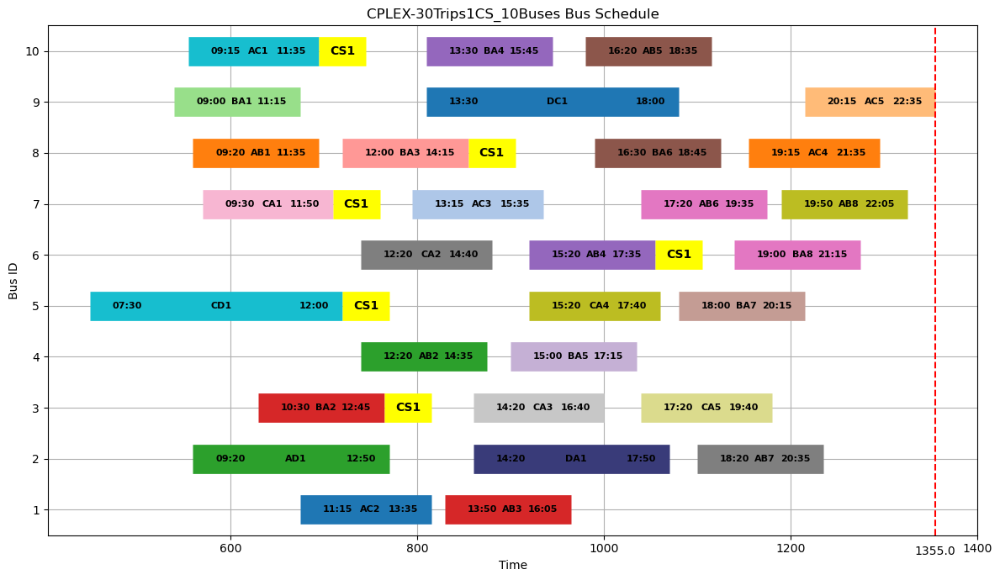

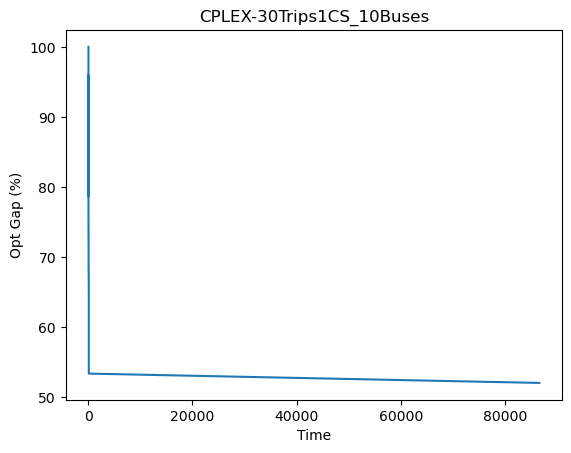

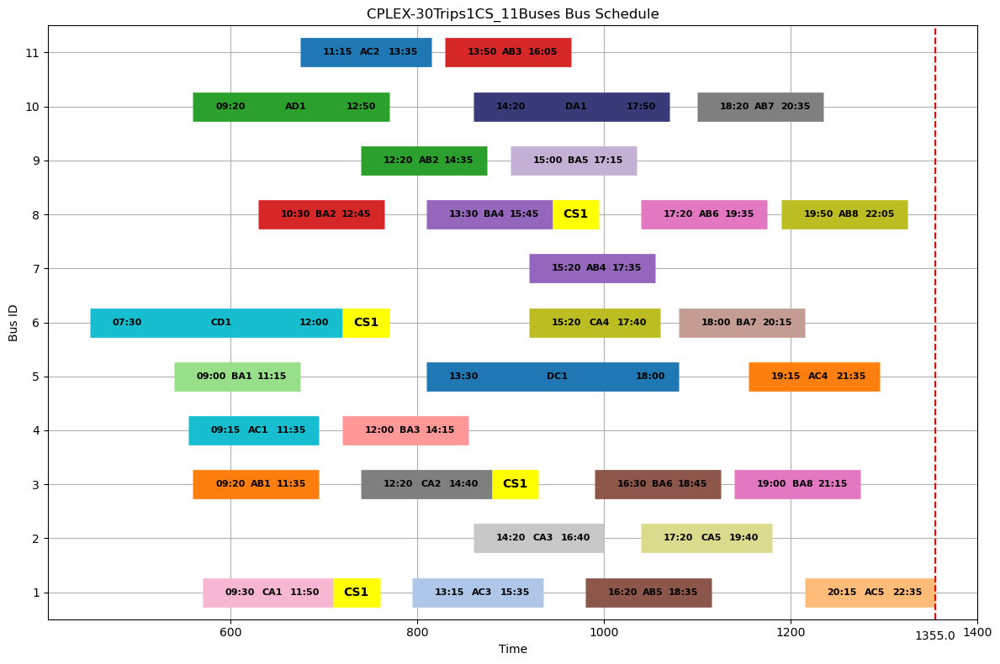

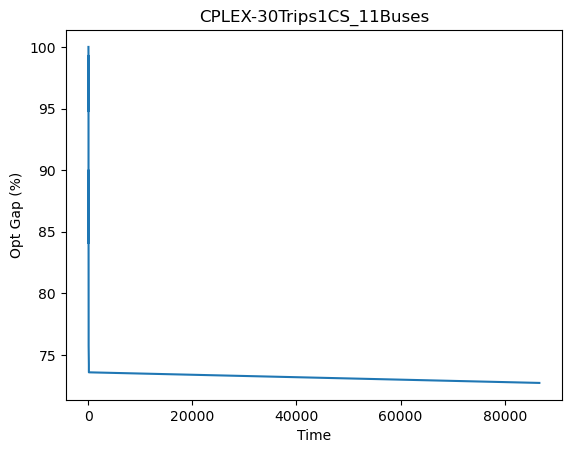

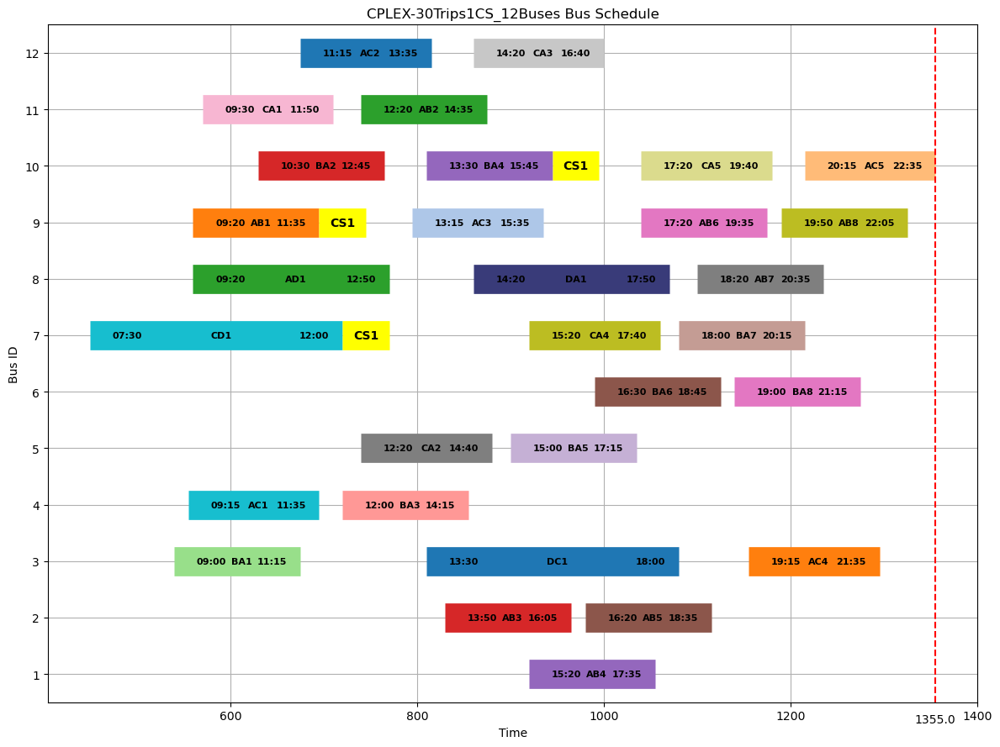

...

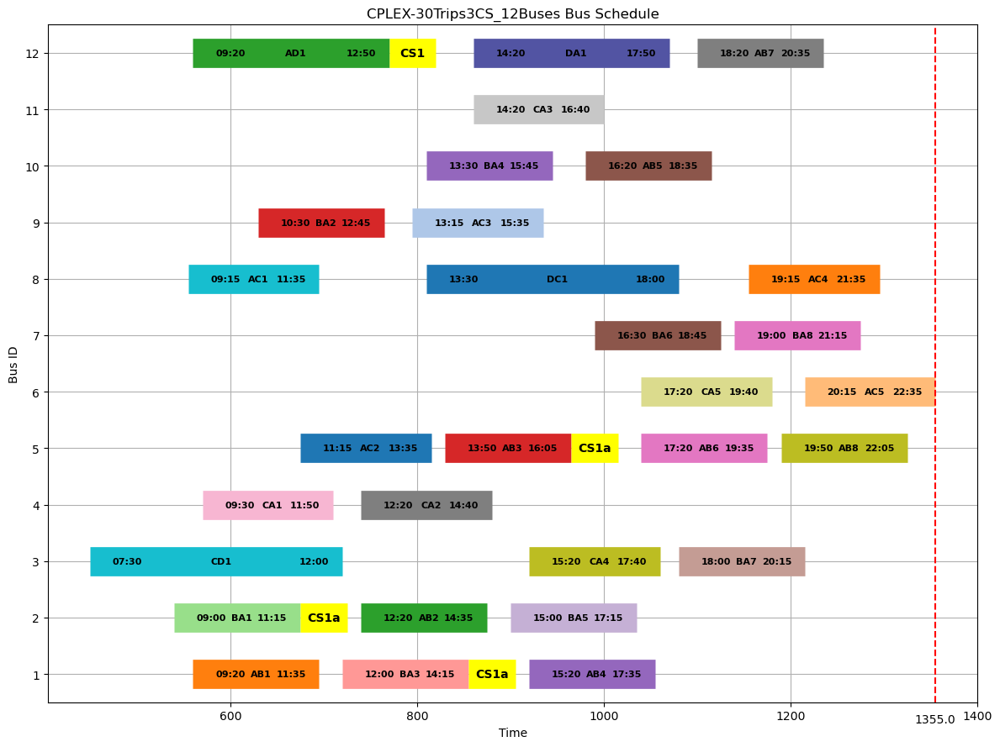

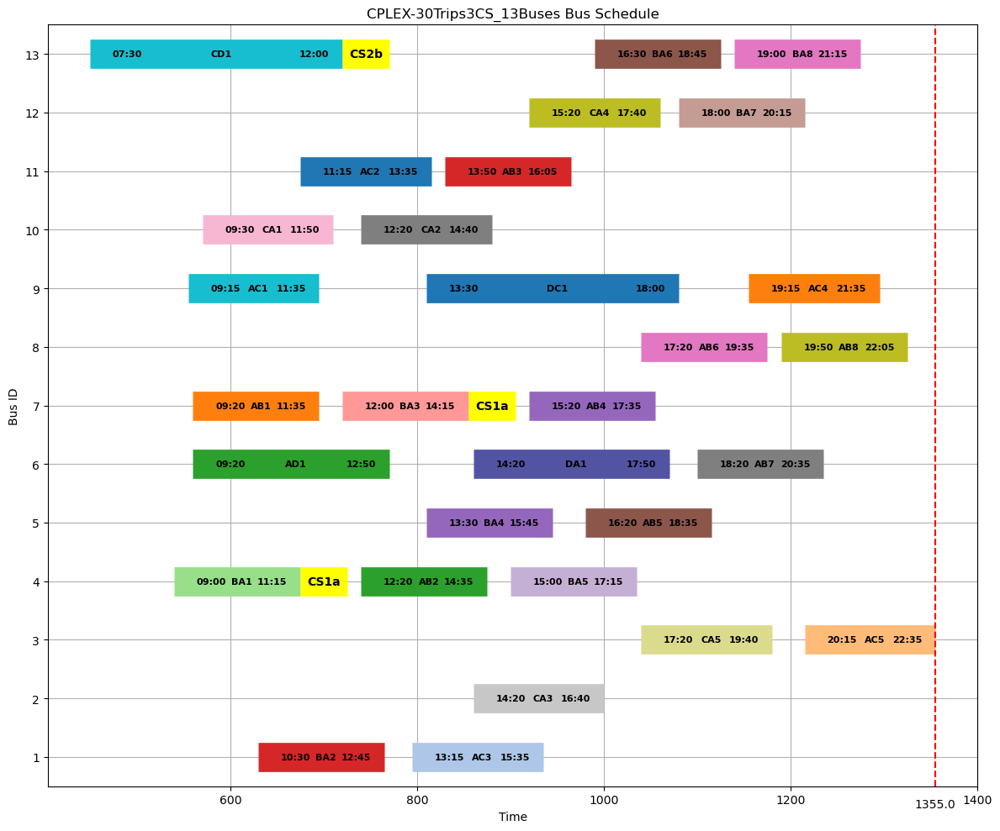

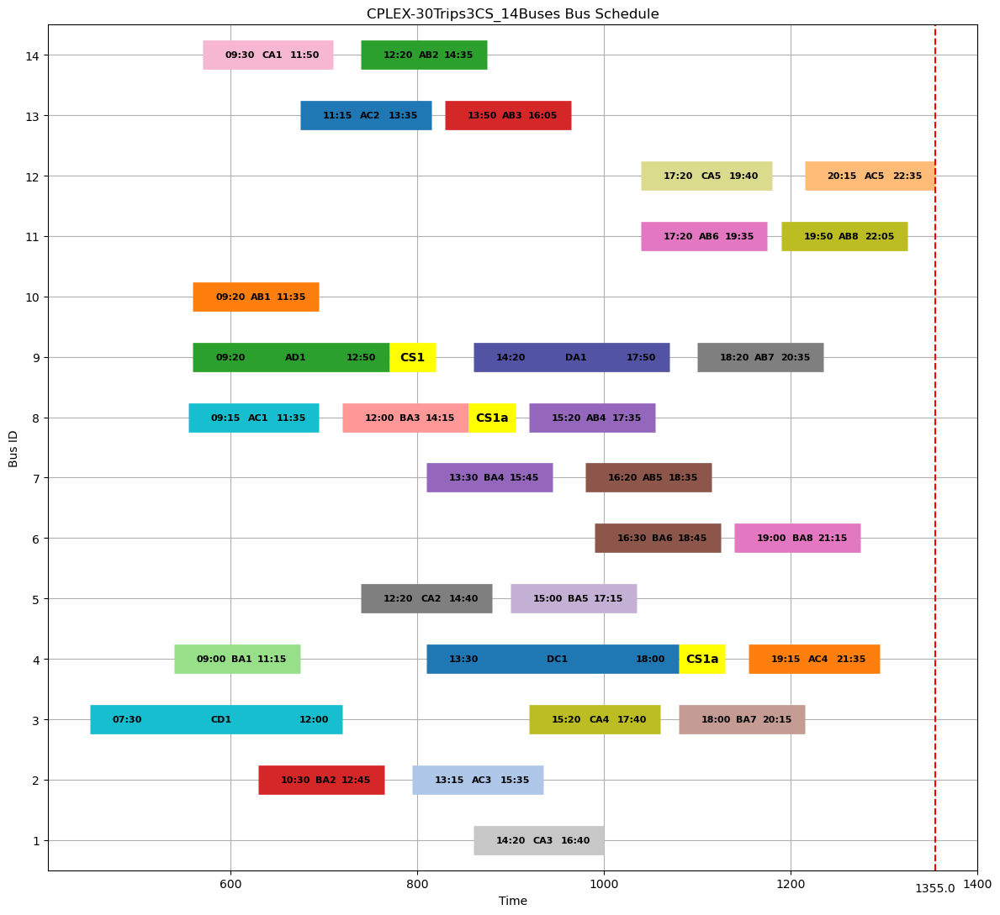

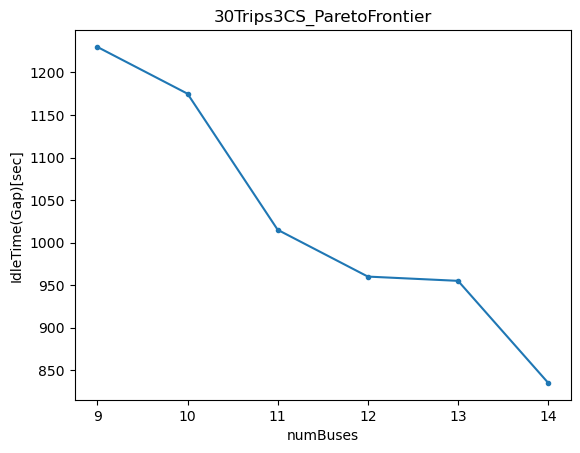

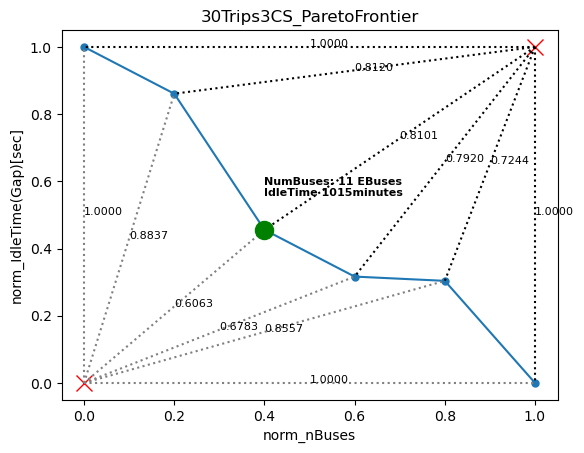

In [39]:
############################################### 30 TRIPS Single CS ###########################################
filepath = r".\\MIP-"
filename = f"{filepath}Data\\final_test.xlsx"
sheetname = "30Trips"

NTrips = 30 #trips
NTerms = 4 #terminals
NCS = 1 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
df = pd.read_excel(filename, sheet_name="test", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="test", usecols="J:L", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="feasible_mat", usecols="B:AF", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="duration_mat", usecols="B:AG", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="Recharged_Feasible_mat", usecols="C:AG", nrows=(NTrips+DEPOT)*NCS)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()

# ################# Time Limit ################
# soln_filename = f"{filepath}Results\\TimeLimit\\RB\\30TripsEVeh1CS_Eq1_RB.txt"
# title = 'CPLEX-30Trips1CS'
# cplex_30Trips1cs_schedule, cplex_30Trips1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# ############### HPC Z Folder ###############
# soln_path = f"{filepath}Results\\HPC"
# soln_filename = f"{soln_path}\\RB_30T1CS.asc"
# title = 'CPLEX-30Trips1CS_HPC'
# cplex_30Trips1cs_schedule_OPT, cplex_30Trips1cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)
minBuses = 10
maxBuses = 16

cplex_pareto_30Trips1CS = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\30TripsEVeh1CS_{i}Buses.asc"
    title = f'CPLEX-30Trips1CS_{i}Buses'
    cplex_1CS_schedule, cplex_1CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_30Trips1CS.append(cplex_1CS_schedule)

    ax = visualizeOptimization(soln_filename, title)

cplex30T1CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex30T1CS_gap = []
cplex30T1CS_solns = []
for cplex_30T1CS in cplex_pareto_30Trips1CS:
    ###### 30Trips ##########
    cplex_30T1CS_df = cplex_30T1CS.copy(deep=True)
    cplex_30T1CS_df['next_dep'] = cplex_30T1CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_30T1CS_df['difference'] = cplex_30T1CS_df['next_dep'] - cplex_30T1CS_df['arr_time']
    cplex_30T1CS_df['difference'] = cplex_30T1CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_30T1CS_soln = cplex_30T1CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex30T1CS_solns.append(cplex_30T1CS_soln)
    cplex30T1CS_gap.append(cplex_30T1CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex30T1CS_nbus, "IdleTime(Gap)[sec]": cplex30T1CS_gap})
title = f"30Trips1CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex30T1CS_norm = pareto_frontier(cplex30T1CS_gap, cplex30T1CS_nbus, title)

############################################### 30 TRIPS 3CSs ###########################################
filename = f"{filepath}Data\\final_test.xlsx"
sheetname = "30Trips"
filepath = r".\\MIP-"
filename = f"{filepath}Data\\final_test.xlsx"
sheetname = "30Trips"


NTrips = 30 #trips
NTerms = 4 #terminals
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
NCS = 3 #recharging stations
df = pd.read_excel(filename, sheet_name="test", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="test", usecols="J:L", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="feasible_mat", usecols="B:AF", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="duration_mat", usecols="B:AI", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="Recharged_Feasible_mat", usecols="C:AG", nrows=(NTrips+DEPOT)*NCS)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()

# soln_filename = f"{filepath}Results\\TimeLimit\\RB\\30TripsEVeh3CS_Eq1_RB.txt"
# title = 'CPLEX-30Trips3CS_IDLE'
# cplex_30Trips3cs_schedule, cplex_30Trips3cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# soln_path = f"{filepath}Results\\HPC"
# soln_filename = f"{soln_path}\\RB_30T3CS.asc"
# title = 'CPLEX-30Trips3CS_HPC'
# cplex_30Trips3cs_schedule_OPT, cplex_30Trips3cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 9
maxBuses = 15
cplex_pareto_30Trips3CS = []
n_buses = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\30TripsEVeh3CS_{i}Buses.asc"
    if not os.path.isfile(soln_filename):
        soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\30TripsEVeh3CS_{i}Buses.txt"
        if not os.path.isfile(soln_filename):
            continue
    title = f'CPLEX-30Trips3CS_{i}Buses'
    print(soln_filename)
    cplex_3CS_schedule, cplex_3CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_30Trips3CS.append(cplex_3CS_schedule)
    n_buses.append(i)

    #ax = visualizeOptimization(soln_filename, title)

cplex30T3CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex30T3CS_gap = []
cplex30T3CS_solns = []
for cplex_30T3CS in cplex_pareto_30Trips3CS:
    ###### 30Trips ##########
    cplex_30T3CS_df = cplex_30T3CS.groupby('bus_id', group_keys=False).apply(apply_custom_shift)
    cplex_30T3CS_df['next_dep'] = cplex_30T3CS_df['next_dep'].fillna(0)
    cplex_30T3CS_df['difference'] = cplex_30T3CS_df['next_dep'] - cplex_30T3CS_df['arr_time']
    cplex_30T3CS_df['difference'] = cplex_30T3CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_30T3CS_soln = cplex_30T3CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex30T3CS_solns.append(cplex_30T3CS_soln)
    cplex30T3CS_gap.append(cplex_30T3CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex30T3CS_nbus, "IdleTime(Gap)[sec]": cplex30T3CS_gap})
title = f"30Trips3CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex30T3CS_norm = pareto_frontier(cplex30T3CS_gap, cplex30T3CS_nbus, title)

In [40]:
print(find_best(cplex30T1CS_norm))
print(find_best(cplex30T3CS_norm))

print(cplex30T1CS_norm)
print(cplex30T3CS_norm)

NumBuses[#]            13.000000
IdleTime(Gap)[sec]    850.000000
Norm_NBuses             0.600000
Norm_Gaps               0.532110
dist_min              290.015517
dist_max              255.007843
dist_norm_min           0.801961
dist_norm_max           0.615566
slope                   2.007548
Name: 3, dtype: float64
NumBuses[#]              9.000000
IdleTime(Gap)[sec]    1230.000000
Norm_NBuses              0.000000
Norm_Gaps                1.000000
dist_min               395.000000
dist_max                 5.000000
dist_norm_min            1.000000
dist_norm_max            1.000000
slope                    1.436364
Name: 0, dtype: float64
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0           10              1105.0          0.0   1.000000  545.000000   
1           11               960.0          0.2   0.733945  400.001250   
2           12               895.0          0.4   0.614679  335.005970   
3           13               850.0          0.6   0.5

soln = .\\MIP-Results\TimeLimit\FINAL\40TripsEVeh1CS_15Buses.asc
{'0': ['CD3', 'CS1', 'AB3', 'DA4'], '1': ['AB1', 'CS1', 'DC3', 'CA4'], '10': ['DC1', 'DA3'], '11': ['AD1', 'DA1', 'CS1', 'BC4', 'AC4'], '12': ['BC2', 'DA2', 'CS1', 'DC4'], '13': ['BC1', 'CD1', 'CS1', 'AC2', 'CA3'], '14': ['AC1', 'BA3'], '2': ['CD2', 'CS1', 'DC2', 'BA5'], '3': ['CB1', 'CS1', 'AC3', 'CB4'], '4': ['CB2', 'BC3'], '5': ['CA2', 'CB3'], '6': ['CA1', 'AB2'], '7': ['BA1', 'CS1', 'CD4', 'AB4'], '8': ['BA2', 'BA4'], '9': ['AD2', 'AD3']}
{'0': ['CD3', 'CS1', 'AB3', 'DA4'], '1': ['AB1', 'CS1', 'DC3', 'CA4'], '10': ['DC1', 'DA3'], '11': ['AD1', 'DA1', 'CS1', 'BC4', 'AC4'], '12': ['BC2', 'DA2', 'CS1', 'DC4'], '13': ['BC1', 'CD1', 'CS1', 'AC2', 'CA3'], '14': ['AC1', 'BA3'], '2': ['CD2', 'CS1', 'DC2', 'BA5'], '3': ['CB1', 'CS1', 'AC3', 'CB4'], '4': ['CB2', 'BC3'], '5': ['CA2', 'CB3'], '6': ['CA1', 'AB2'], '7': ['BA1', 'CS1', 'CD4', 'AB4'], '8': ['BA2', 'BA4'], '9': ['AD2', 'AD3']}
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur =

soln = .\\MIP-Results\TimeLimit\FINAL\40TripsEVeh1CS_23Buses.asc
{'0': ['CA1', 'AB2'], '1': ['BA4', 'DC4'], '10': ['CB1'], '11': ['CA3'], '12': ['CD4', 'AB4'], '13': ['BC2', 'DA2'], '14': ['BA2', 'DC3'], '15': ['AB1'], '16': ['DA4', 'AC4'], '17': ['AC3', 'BC4'], '18': ['BC1'], '19': ['BC3', 'CB4'], '2': ['CD2', 'CS1', 'DC2', 'BA5'], '20': ['AC2', 'AB3'], '21': ['BA1'], '22': ['AD1', 'DA1'], '3': ['CD1', 'CD3'], '4': ['CB2', 'DA3'], '5': ['AD2', 'AD3'], '6': ['AC1', 'BA3'], '7': ['DC1'], '8': ['CA4'], '9': ['CA2', 'CB3']}
{'0': ['CA1', 'AB2'], '1': ['BA4', 'DC4'], '10': ['CB1'], '11': ['CA3'], '12': ['CD4', 'AB4'], '13': ['BC2', 'DA2'], '14': ['BA2', 'DC3'], '15': ['AB1'], '16': ['DA4', 'AC4'], '17': ['AC3', 'BC4'], '18': ['BC1'], '19': ['BC3', 'CB4'], '2': ['CD2', 'CS1', 'DC2', 'BA5'], '20': ['AC2', 'AB3'], '21': ['BA1'], '22': ['AD1', 'DA1'], '3': ['CD1', 'CD3'], '4': ['CB2', 'DA3'], '5': ['AD2', 'AD3'], '6': ['AC1', 'BA3'], '7': ['DC1'], '8': ['CA4'], '9': ['CA2', 'CB3']}
cs!!! dur =

C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(12, int(len(buses)/2) + 2)) if len(trips) < 30 else plt.subplots(1,1, figsize=(12, len(buses)-3)) if len(trips) < 40 else plt.subplots(1,1, figsize=(14, len(buses)-6))


soln = .\\MIP-Results\TimeLimit\FINAL\40TripsEVeh1CS_26Buses.asc
{'0': ['BC2', 'DA2'], '1': ['CD2'], '10': ['CA2', 'CB3'], '11': ['BA1'], '12': ['AB4'], '13': ['CA3'], '14': ['CA1'], '15': ['BA2', 'DC3'], '16': ['CD1', 'CD3'], '17': ['AB1'], '18': ['BA4', 'DC4'], '19': ['AC3', 'BC4'], '2': ['DA4', 'AC4'], '20': ['AC2', 'AB3'], '21': ['CD4', 'CA4'], '22': ['AD2', 'AD3'], '23': ['DC1'], '24': ['DC2', 'BA5'], '25': ['CB2', 'BC3'], '3': ['AD1', 'DA1'], '4': ['CB4'], '5': ['BC1'], '6': ['CB1'], '7': ['DA3'], '8': ['AC1', 'BA3'], '9': ['AB2']}
{'0': ['BC2', 'DA2'], '1': ['CD2'], '10': ['CA2', 'CB3'], '11': ['BA1'], '12': ['AB4'], '13': ['CA3'], '14': ['CA1'], '15': ['BA2', 'DC3'], '16': ['CD1', 'CD3'], '17': ['AB1'], '18': ['BA4', 'DC4'], '19': ['AC3', 'BC4'], '2': ['DA4', 'AC4'], '20': ['AC2', 'AB3'], '21': ['CD4', 'CA4'], '22': ['AD2', 'AD3'], '23': ['DC1'], '24': ['DC2', 'BA5'], '25': ['CB2', 'BC3'], '3': ['AD1', 'DA1'], '4': ['CB4'], '5': ['BC1'], '6': ['CB1'], '7': ['DA3'], '8': ['AC1',

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


soln = .\\MIP-Results\TimeLimit\FINAL\40TripsEVeh3CS_15Buses.asc
{'0': ['AC1', 'DA1'], '1': ['CB2', 'DA3'], '10': ['AB1', 'CS1', 'DC3', 'AB4'], '11': ['CD2', 'CS1', 'DC2', 'BA5'], '12': ['AD2', 'AD3'], '13': ['BA1', 'CS1a', 'AB2', 'CB3'], '14': ['CA1', 'CA2'], '2': ['AD1', 'BA3'], '3': ['CD3', 'DA2', 'CS2b', 'BC4', 'AC4'], '4': ['CB1', 'CS1', 'CD4', 'CA4'], '5': ['BA2', 'BC3'], '6': ['BC2', 'CS1a', 'AC3', 'CB4'], '7': ['AB3', 'DA4'], '8': ['BC1', 'CD1', 'CS1', 'AC2', 'CA3'], '9': ['DC1', 'CS2b', 'BA4', 'DC4']}
{'0': ['AC1', 'DA1'], '1': ['CB2', 'DA3'], '10': ['AB1', 'CS1', 'DC3', 'AB4'], '11': ['CD2', 'CS1', 'DC2', 'BA5'], '12': ['AD2', 'AD3'], '13': ['BA1', 'CS1a', 'AB2', 'CB3'], '14': ['CA1', 'CA2'], '2': ['AD1', 'BA3'], '3': ['CD3', 'DA2', 'CS2b', 'BC4', 'AC4'], '4': ['CB1', 'CS1', 'CD4', 'CA4'], '5': ['BA2', 'BC3'], '6': ['BC2', 'CS1a', 'AC3', 'CB4'], '7': ['AB3', 'DA4'], '8': ['BC1', 'CD1', 'CS1', 'AC2', 'CA3'], '9': ['DC1', 'CS2b', 'BA4', 'DC4']}
cs!!! dur = 50
cs!!! dur = 50
cs!

C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:66: PerformanceWarning: indexing past lexsort depth may impact performance.
  if (j,m) in schedule.index:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:67: PerformanceWarning: indexing past lexsort depth may impact performance.
  if type(schedule.loc[(j,m), 'dep_time']) == np.int64:
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:74: PerformanceWarning: indexing past lexsort depth may impact performance.
  xs = schedule.loc[(j,m), 'dep_time'].iloc[0]
C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\C

cs!!! dur = 50
soln = .\\MIP-Results\TimeLimit\FINAL\40TripsEVeh3CS_25Buses.asc
{'0': ['AD1', 'BA3'], '1': ['AC2', 'AB3'], '10': ['DC2', 'BA5'], '11': ['CD4', 'AB4'], '12': ['CB1'], '13': ['CB4'], '14': ['AC1'], '15': ['BC2'], '16': ['CB2', 'BC3'], '17': ['AC3', 'BC4'], '18': ['DA4', 'AC4'], '19': ['CA2', 'CB3'], '2': ['CD1', 'DC1'], '20': ['AD2', 'AD3'], '21': ['AB1', 'DA1'], '22': ['CD3', 'DA2'], '23': ['CA3'], '24': ['CD2'], '3': ['CA1', 'AB2'], '4': ['BA2', 'DC3'], '5': ['CA4'], '6': ['BC1'], '7': ['DA3'], '8': ['BA1'], '9': ['BA4', 'DC4']}
{'0': ['AD1', 'BA3'], '1': ['AC2', 'AB3'], '10': ['DC2', 'BA5'], '11': ['CD4', 'AB4'], '12': ['CB1'], '13': ['CB4'], '14': ['AC1'], '15': ['BC2'], '16': ['CB2', 'BC3'], '17': ['AC3', 'BC4'], '18': ['DA4', 'AC4'], '19': ['CA2', 'CB3'], '2': ['CD1', 'DC1'], '20': ['AD2', 'AD3'], '21': ['AB1', 'DA1'], '22': ['CD3', 'DA2'], '23': ['CA3'], '24': ['CD2'], '3': ['CA1', 'AB2'], '4': ['BA2', 'DC3'], '5': ['CA4'], '6': ['BC1'], '7': ['DA3'], '8': ['BA1'],

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


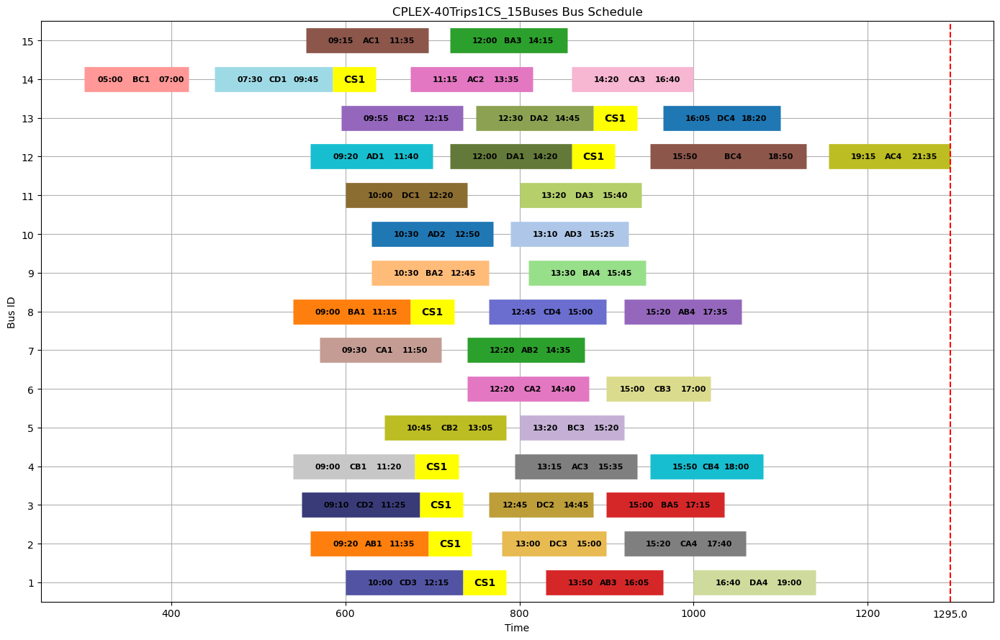

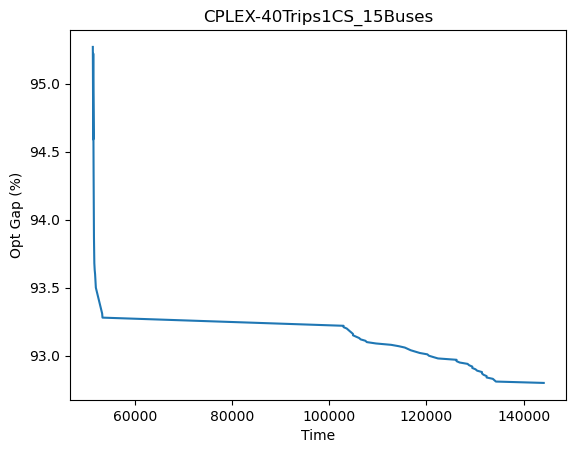

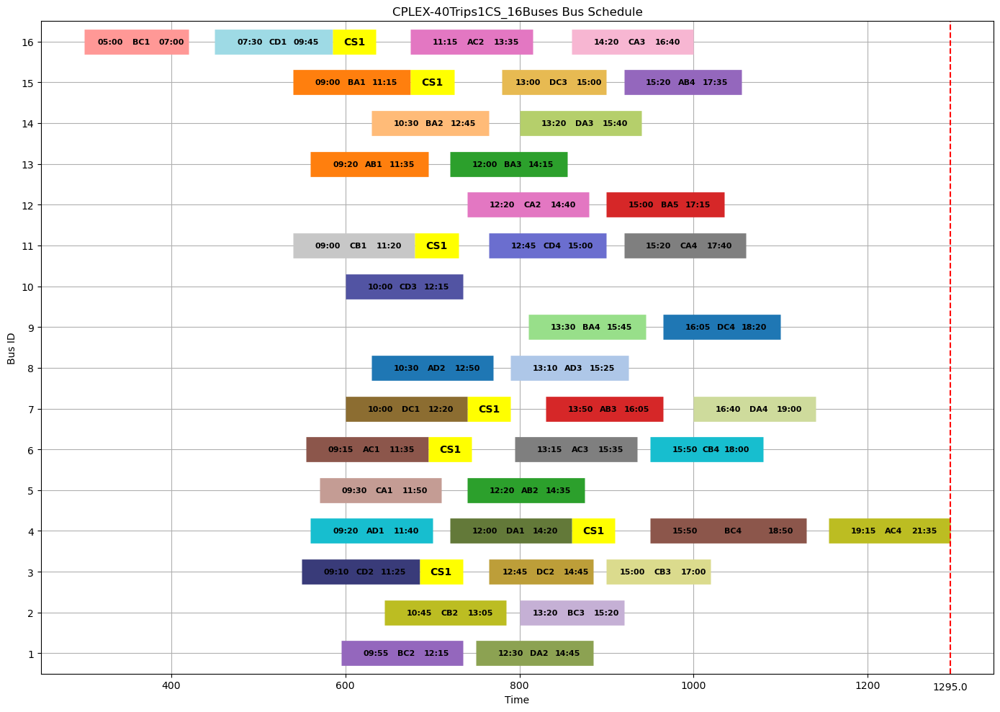

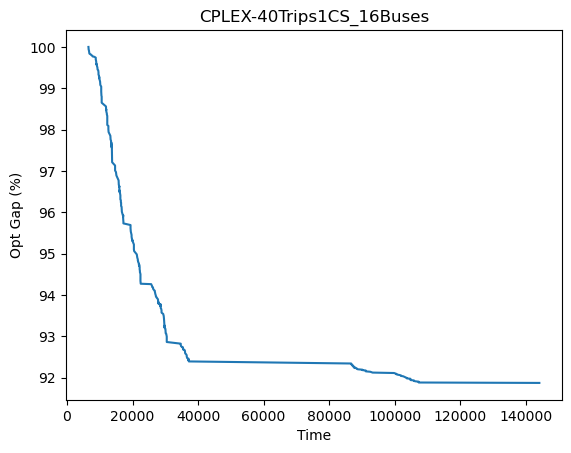

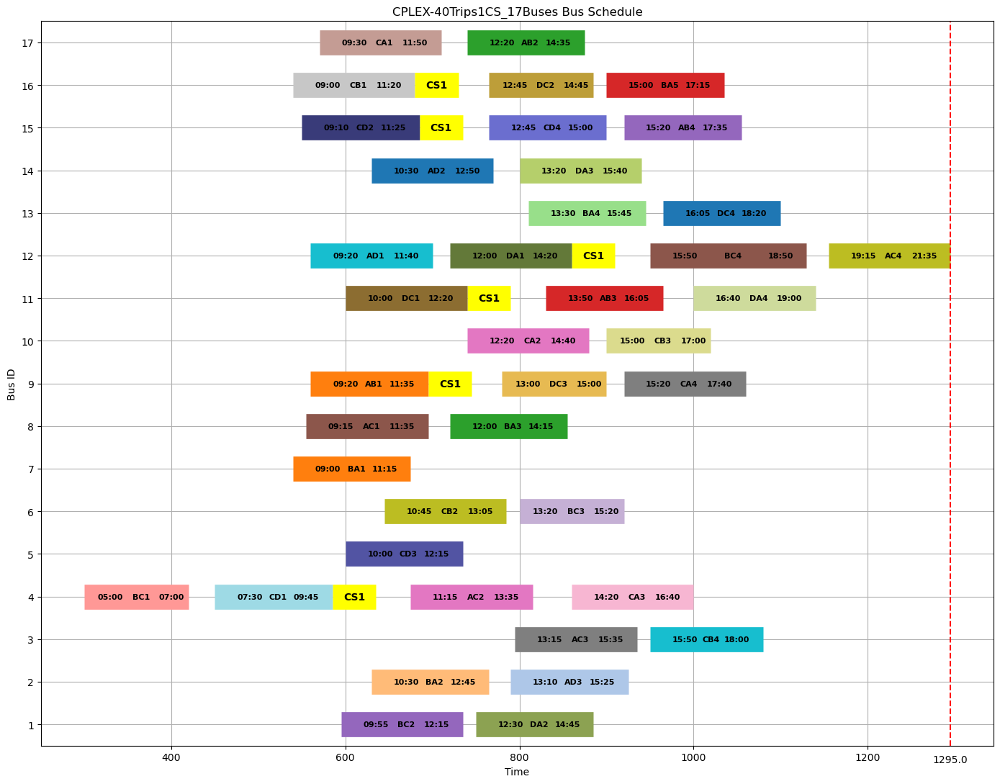

...

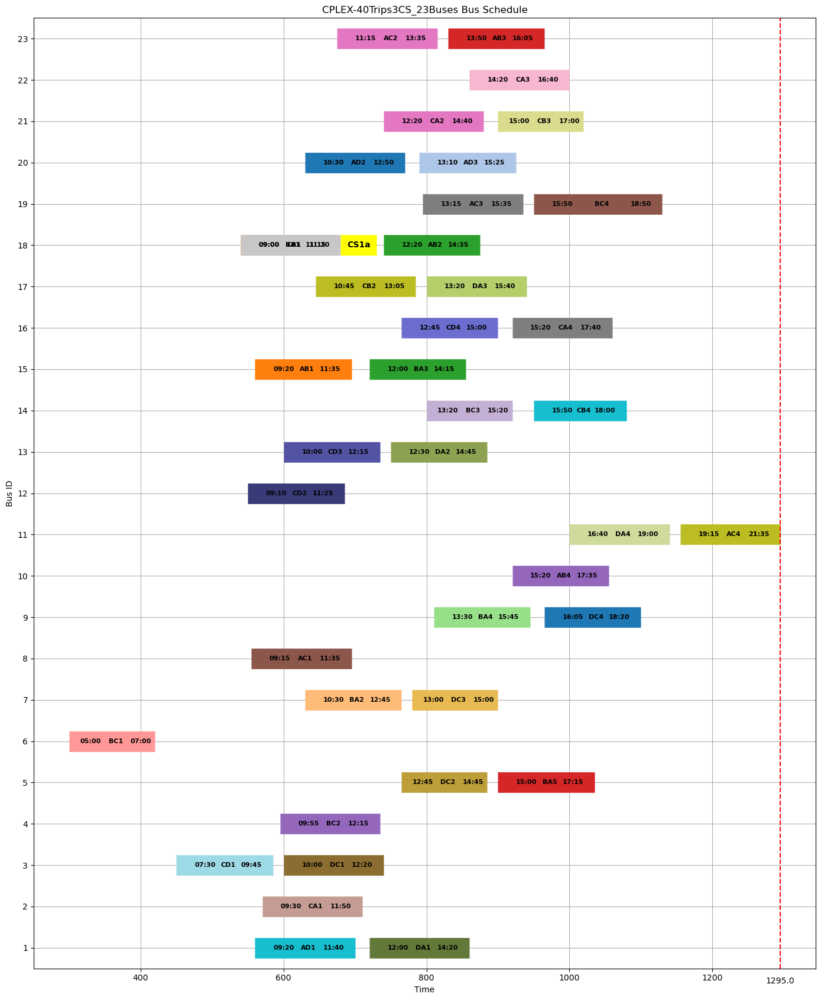

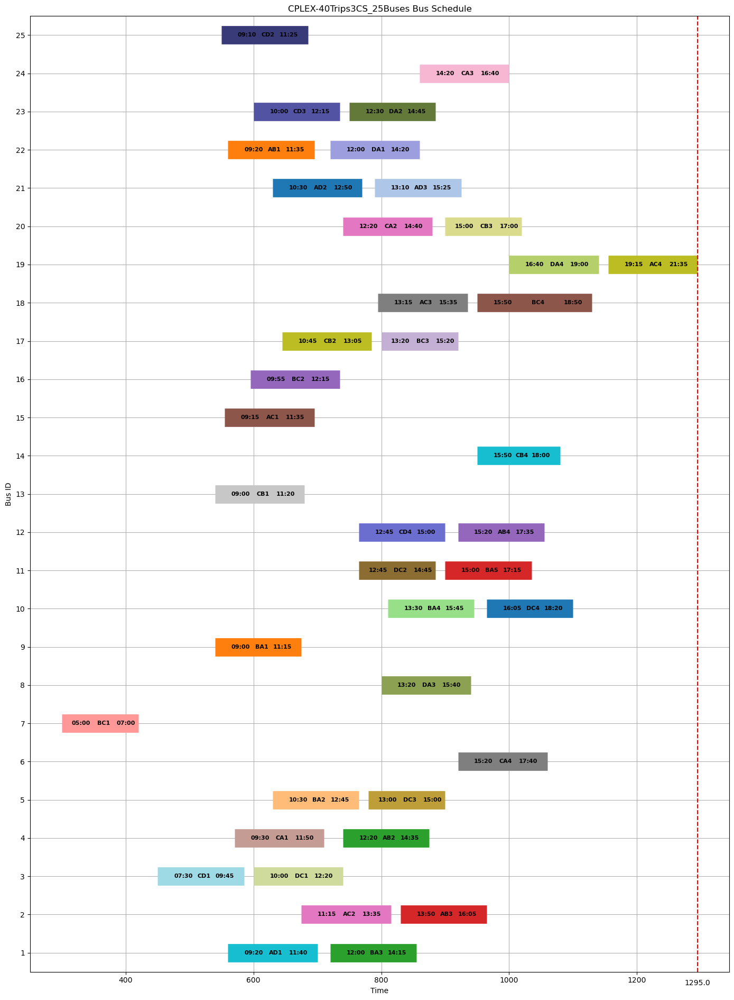

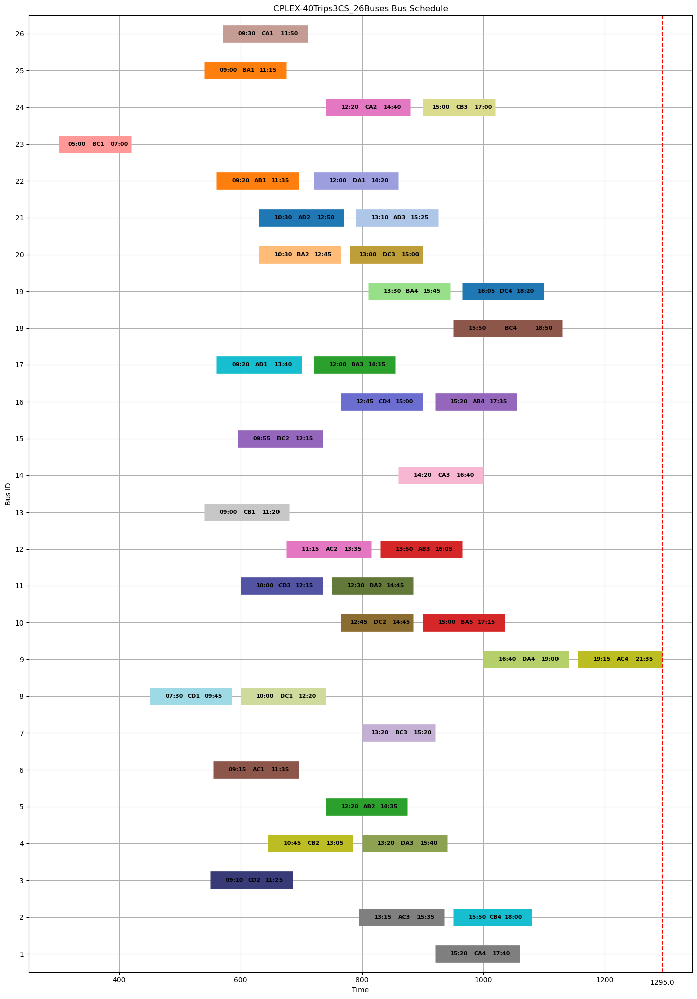

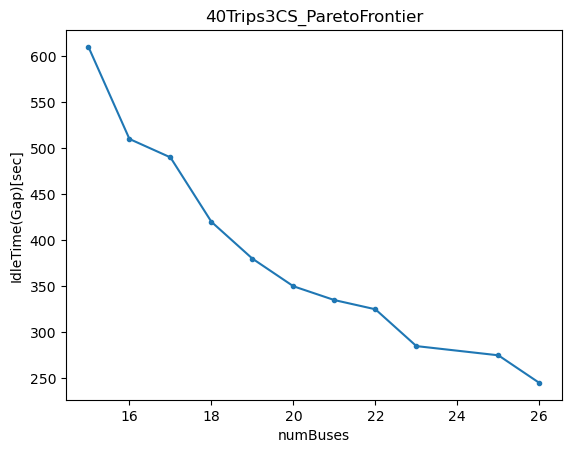

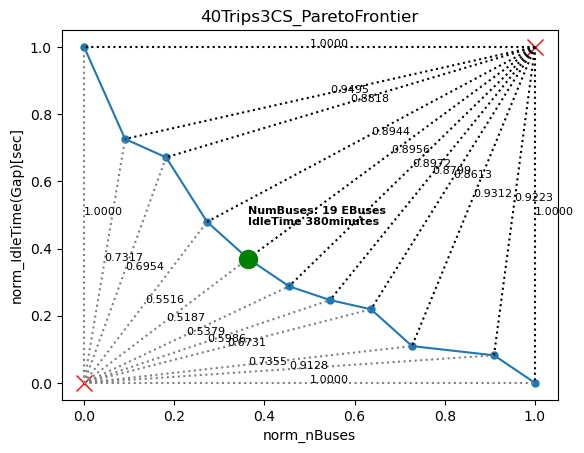

In [41]:
############################################### 40 TRIPS Single CS ###########################################
filepath = r".\\MIP-"
filename = f"{filepath}Data\\data_20_40trips.xlsx"
sheetname = "40Trips"

NTrips = 40 #trips
NTerms = 2 #terminals
NCS = 1 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
# print(filename)
df = pd.read_excel(filename, sheet_name="40Trips", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="40Trips", usecols="J:L", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="gamma", usecols="B:AP", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="delta", usecols="B:AR", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="phi", usecols="C:AQ", nrows=(NTrips+DEPOT)*NCS)
# zeta = pd.read_excel(filename, sheet_name="10Trips", usecols="", skiprows=, nrows=()))
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()

C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
# soln_filename = f"{filepath}cplex_results\\10TripsEVeh1CS_Eq1.txt"
# soln_filename = f"{filepath}Results\\TimeLimit\\RB\\40TripsEVeh1CS_Eq1_RB.txt"
# title = 'CPLEX-40Trips1CS'
# cplex_40Trips1cs_schedule, cplex_40Trips1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# soln_filename = f"{filepath}Results\\HPC\\RB_40T1CS.asc"
# title = 'CPLEX-40Trips1CS'
# cplex_40Trips1cs_schedule_OPT, cplex_40Trips1cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 15
maxBuses = 28
cplex_pareto_40Trips1CS = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\40TripsEVeh1CS_{i}Buses.asc"
    if not os.path.isfile(soln_filename):
        pass
    else:
        print(f"soln = {soln_filename}")
    title = f'CPLEX-40Trips1CS_{i}Buses'
    cplex_1CS_schedule, cplex_1CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_40Trips1CS.append(cplex_1CS_schedule)

    ax = visualizeOptimization(soln_filename, title)

cplex40T1CS_nbus = [x for x in range(minBuses, maxBuses)]
cplex40T1CS_gap = []
for cplex_40T1CS in cplex_pareto_40Trips1CS:
    ###### 40Trips ##########
    cplex_40T1CS_df = cplex_40T1CS.copy(deep=True)
    cplex_40T1CS_df['next_dep'] = cplex_40T1CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_40T1CS_df['difference'] = cplex_40T1CS_df['next_dep'] - cplex_40T1CS_df['arr_time']
    cplex_40T1CS_df['difference'] = cplex_40T1CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_40T1CS_soln = cplex_40T1CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex40T1CS_gap.append(cplex_40T1CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex40T1CS_nbus, "IdleTime(Gap)[sec]": cplex40T1CS_gap})
title = f"40Trips1CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex40T1CS_norm = pareto_frontier(cplex40T1CS_gap, cplex40T1CS_nbus, title)

############################################### 40 TRIPS MULTIPLE CSs ###########################################
filepath = r".\\MIP-"
filename = f"{filepath}Data\\data_20_40trips.xlsx"
sheetname = "40Trips"

NTrips = 40 #trips
NTerms = 4 #terminals
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
NCS = 3 #recharging stations
df = pd.read_excel(filename, sheet_name="40Trips", usecols="A:G", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="40Trips", usecols="J:L", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="gamma", usecols="B:AP", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="delta", usecols="B:AR", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="phi", usecols="C:AQ", nrows=(NTrips+DEPOT)*NCS)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()

minBuses = 15
maxBuses = 27
cplex_pareto_40Trips3CS = []
numBuses = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\40TripsEVeh3CS_{i}Buses.asc"
    if not os.path.isfile(soln_filename):
        soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\40TripsEVeh3CS_{i}Buses.txt"
        if not os.path.isfile(soln_filename):
            continue
    print(f"soln = {soln_filename}")
    title = f'CPLEX-40Trips3CS_{i}Buses'
    cplex_3CS_schedule, cplex_3CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_40Trips3CS.append(cplex_3CS_schedule)
    numBuses.append(i)
#     ax = visualizeOptimization(soln_filename, title)

cplex40T3CS_nbus = numBuses
cplex40T3CS_gap = []
for cplex_40T3CS in cplex_pareto_40Trips3CS:
    ###### 40Trips ##########
    cplex_40T3CS_df = cplex_40T3CS.copy(deep=True)
    cplex_40T3CS_df['next_dep'] = cplex_40T3CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_40T3CS_df['difference'] = cplex_40T3CS_df['next_dep'] - cplex_40T3CS_df['arr_time']
    cplex_40T3CS_df['difference'] = cplex_40T3CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_40T3CS_soln = cplex_40T3CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex40T3CS_gap.append(cplex_40T3CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex40T3CS_nbus, "IdleTime(Gap)[sec]": cplex40T3CS_gap})
title = f"40Trips3CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex40T3CS_norm = pareto_frontier(cplex40T3CS_gap, cplex40T3CS_nbus, title)


In [42]:
print(find_best(cplex40T1CS_norm))
print(find_best(cplex40T3CS_norm))

print(cplex40T1CS_norm)
print(cplex40T3CS_norm)

NumBuses[#]            24.000000
IdleTime(Gap)[sec]    305.000000
Norm_NBuses             0.750000
Norm_Gaps               0.151786
dist_min               85.475143
dist_max              475.009474
dist_norm_min           0.765205
dist_norm_max           0.884289
slope                   1.555556
Name: 9, dtype: float64
NumBuses[#]            26.000000
IdleTime(Gap)[sec]    245.000000
Norm_NBuses             1.000000
Norm_Gaps               0.000000
dist_min               11.000000
dist_max              365.000000
dist_norm_min           1.000000
dist_norm_max           1.000000
slope                   1.106061
Name: 10, dtype: float64
    NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0            15               780.0     0.000000   1.000000  560.000000   
1            16               695.0     0.083333   0.848214  475.001053   
2            17               625.0     0.166667   0.723214  405.004938   
3            18               570.0     0.250000   0.6250

soln = .\\MIP-Results\TimeLimit\FINAL\54T1CS17B_PF.asc
{'0': ['CB2', 'BC3', 'CS1', 'CA5', 'AC5'], '1': ['BA4', 'AB5', 'BA8'], '10': ['CD5', 'DA4', 'AC4'], '11': ['AC1', 'CS1', 'DC3', 'CA4', 'AB7'], '12': ['CD3', 'DA2', 'AB4'], '13': ['AC2', 'CA3', 'AB6'], '14': ['AC3', 'CB4'], '15': ['AD2', 'DA3', 'AD4'], '16': ['BA2', 'AD3', 'DC5'], '2': ['CD1', 'DC1', 'CS1', 'AB3', 'BA6', 'AB8'], '3': ['AB1', 'BA3'], '4': ['BA1'], '5': ['BC1', 'CB1', 'CS1', 'DC2', 'CB3', 'BA7'], '6': ['CA1', 'AB2', 'BA5', 'CS1', 'AD5'], '7': ['AD1', 'DA1', 'CS1', 'BC4', 'DA5'], '8': ['CD2', 'CA2'], '9': ['BC2', 'CD4', 'DC4']}
{'0': ['CB2', 'BC3', 'CS1', 'CA5', 'AC5'], '1': ['BA4', 'AB5', 'BA8'], '10': ['CD5', 'DA4', 'AC4'], '11': ['AC1', 'CS1', 'DC3', 'CA4', 'AB7'], '12': ['CD3', 'DA2', 'AB4'], '13': ['AC2', 'CA3', 'AB6'], '14': ['AC3', 'CB4'], '15': ['AD2', 'DA3', 'AD4'], '16': ['BA2', 'AD3', 'DC5'], '2': ['CD1', 'DC1', 'CS1', 'AB3', 'BA6', 'AB8'], '3': ['AB1', 'BA3'], '4': ['BA1'], '5': ['BC1', 'CB1', 'CS1', 'DC2',

cs!!! dur = 50
soln = .\\MIP-Results\TimeLimit\FINAL\54T1CS24B_PF.asc
{'0': ['BC2', 'AC3'], '1': ['CD3', 'DC2', 'CB3'], '10': ['BC1'], '11': ['CD1', 'DC1', 'CD4'], '12': ['AC2', 'CA3', 'AB6'], '13': ['BA2', 'AD3', 'DC4'], '14': ['AB1', 'BA3'], '15': ['BA1'], '16': ['AD5'], '17': ['BA4', 'AB5', 'BA8'], '18': ['AC1', 'CA2'], '19': ['AD1', 'DA1'], '2': ['CB1'], '20': ['CD2'], '21': ['DC5'], '22': ['CB2', 'BC3', 'CB4'], '23': ['AB3', 'BA6', 'AC4'], '3': ['BC4', 'DA5'], '4': ['CA1', 'AB2', 'BA5'], '5': ['DA2', 'AB4', 'BA7'], '6': ['AD2', 'DA3', 'AD4'], '7': ['CD5', 'DA4', 'AB8'], '8': ['CA5', 'AC5'], '9': ['DC3', 'CA4', 'AB7']}
{'0': ['BC2', 'AC3'], '1': ['CD3', 'DC2', 'CB3'], '10': ['BC1'], '11': ['CD1', 'DC1', 'CD4'], '12': ['AC2', 'CA3', 'AB6'], '13': ['BA2', 'AD3', 'DC4'], '14': ['AB1', 'BA3'], '15': ['BA1'], '16': ['AD5'], '17': ['BA4', 'AB5', 'BA8'], '18': ['AC1', 'CA2'], '19': ['AD1', 'DA1'], '2': ['CB1'], '20': ['CD2'], '21': ['DC5'], '22': ['CB2', 'BC3', 'CB4'], '23': ['AB3', 'BA6'

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



soln = .\\MIP-Results\TimeLimit\FINAL\54TripsEVeh3CS_17Buses.asc
{'0': ['CB1', 'CA2'], '1': ['BC3', 'DC5'], '10': ['CD5', 'DA4', 'AC4'], '11': ['BC2', 'CS1a', 'AC3', 'CB4'], '12': ['CD2', 'DC2', 'CB3'], '13': ['CD1', 'DC1', 'CD4', 'CS1', 'AB5', 'BA8'], '14': ['CB2', 'BA4', 'CS1', 'CA5', 'AC5'], '15': ['AB1', 'BA3', 'CS1', 'BC4', 'DA5'], '16': ['AC2', 'CA3', 'AB6'], '2': ['BC1', 'CS1', 'BA1'], '3': ['AD2', 'DA3', 'AD4'], '4': ['BA2', 'AD3', 'DC4'], '5': ['AD1', 'DA1', 'CS1a', 'AB4', 'BA7'], '6': ['AC1', 'DA2'], '7': ['CD3', 'DC3', 'CA4', 'CS1a', 'AD5'], '8': ['AB3', 'BA6', 'CS1a', 'AB8'], '9': ['CA1', 'AB2', 'BA5', 'CS1a', 'AB7']}
{'0': ['CB1', 'CA2'], '1': ['BC3', 'DC5'], '10': ['CD5', 'DA4', 'AC4'], '11': ['BC2', 'CS1a', 'AC3', 'CB4'], '12': ['CD2', 'DC2', 'CB3'], '13': ['CD1', 'DC1', 'CD4', 'CS1', 'AB5', 'BA8'], '14': ['CB2', 'BA4', 'CS1', 'CA5', 'AC5'], '15': ['AB1', 'BA3', 'CS1', 'BC4', 'DA5'], '16': ['AC2', 'CA3', 'AB6'], '2': ['BC1', 'CS1', 'BA1'], '3': ['AD2', 'DA3', 'AD4'], '4'

C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:55: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
soln = .\\MIP-Results\TimeLimit\FINAL\54TripsEVeh3CS_18Buses.asc
{'0': ['AD1', 'DA1', 'CS1', 'BC4', 'DA5'], '1': ['CD5', 'DA4', 'AC4'], '10': ['AB1', 'BA3', 'CS1a', 'AB4', 'BA7'], '11': ['AD2', 'DA3', 'AD4'], '12': ['CA5', 'AC5'], '13': ['BA2', 'AD3', 'DC5'], '14': ['CD3', 'DA2', 'CS1', 'DC4'], '15': ['CA1', 'AB2', 'BA5', 'CS1', 'AD5'], '16': ['CD2', 'DC2', 'CB3'], '17': ['BC2', 'CS1a', 'AC3', 'CB4'], '2': ['CD1', 'DC1', 'CD4'], '3': ['BC1', 'CS1', 'BA1'], '4': ['CB2', 'BC3'], '5': ['AC1', 'CS1', 'DC3', 'CA4', 'AB7'], '6': ['CB1', 'CA2'], '7': ['AB3', 'BA6', 'AB8'], '8': ['BA4', 'AB5', 'BA8'], '9': ['AC2', 'CA3', 'AB6']}
{'0': ['AD1', 'DA1', 'CS1', 'BC4', 'DA5'], '1': ['CD5', 'DA4', 'AC4'], '10': ['AB1', 'BA3', 'CS1a', 'AB4', 'BA7'], '11': ['AD2', 'DA3', 'AD4'], '12': ['CA5', 'AC5'], '13': ['BA2', 'AD3', 'DC5'], '14': ['CD3', 'DA2', 'CS1', 'DC4'], '15':

cs!!! dur = 50
cs!!! dur = 50
soln = .\\MIP-Results\TimeLimit\FINAL\54TripsEVeh3CS_26Buses.asc
{'0': ['AC1', 'CA2'], '1': ['BC2', 'CS1a', 'AC3', 'CB4'], '10': ['CD3', 'DC2', 'CB3'], '11': ['AD2', 'DA3', 'AD4'], '12': ['BA1'], '13': ['BC1'], '14': ['BC4'], '15': ['AB1', 'BA3'], '16': ['CB1'], '17': ['AD5'], '18': ['AC2', 'CA3', 'AB6'], '19': ['CD2'], '2': ['CA5', 'AC5'], '20': ['CD1', 'DC1', 'CD4'], '21': ['BA4', 'AB5', 'BA8'], '22': ['DA5'], '23': ['DC5'], '24': ['CD5', 'DA4', 'AC4'], '25': ['BA2', 'AD3', 'DC4'], '3': ['DA2', 'AB4', 'BA7'], '4': ['AB8'], '5': ['AB3', 'BA6'], '6': ['CB2', 'BC3'], '7': ['CA1', 'AB2', 'BA5'], '8': ['DC3', 'CA4', 'AB7'], '9': ['AD1', 'DA1']}
{'0': ['AC1', 'CA2'], '1': ['BC2', 'CS1a', 'AC3', 'CB4'], '10': ['CD3', 'DC2', 'CB3'], '11': ['AD2', 'DA3', 'AD4'], '12': ['BA1'], '13': ['BC1'], '14': ['BC4'], '15': ['AB1', 'BA3'], '16': ['CB1'], '17': ['AD5'], '18': ['AC2', 'CA3', 'AB6'], '19': ['CD2'], '2': ['CA5', 'AC5'], '20': ['CD1', 'DC1', 'CD4'], '21': ['BA4',

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



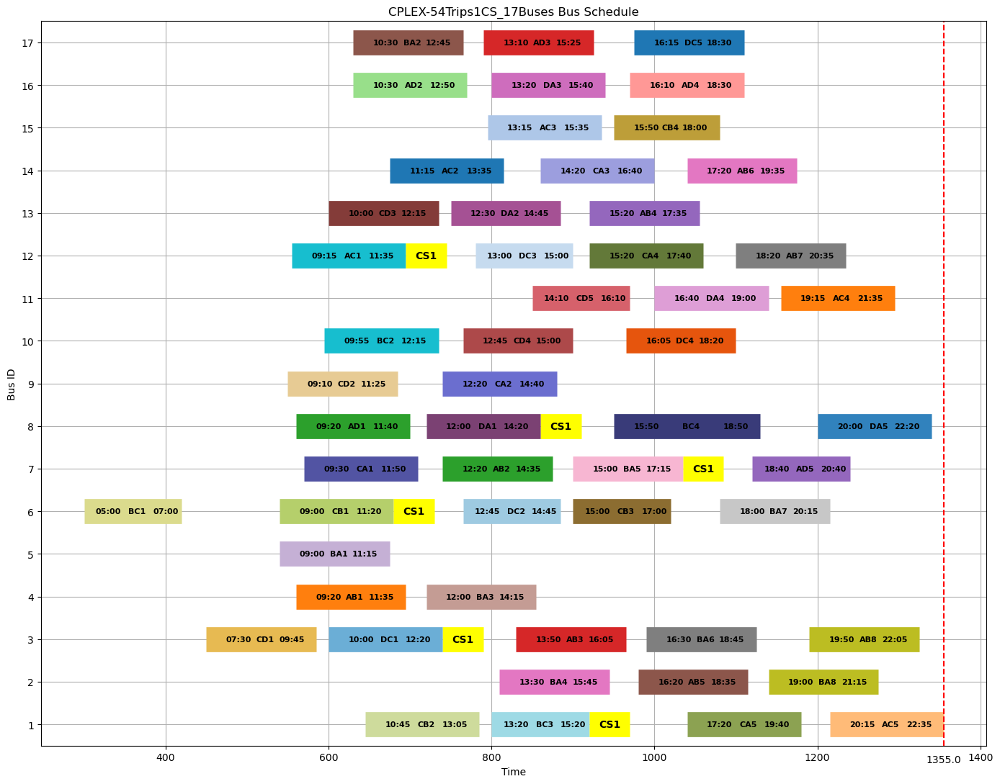

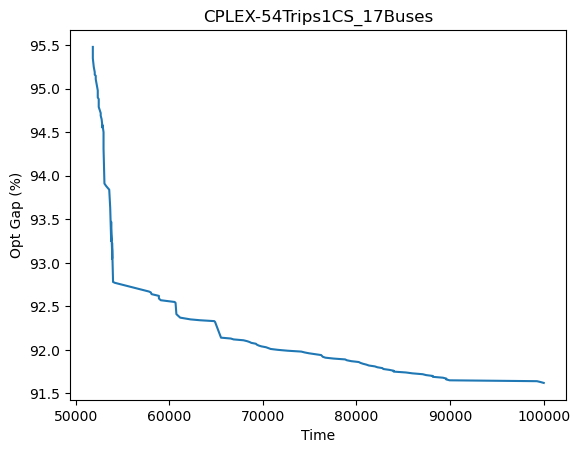

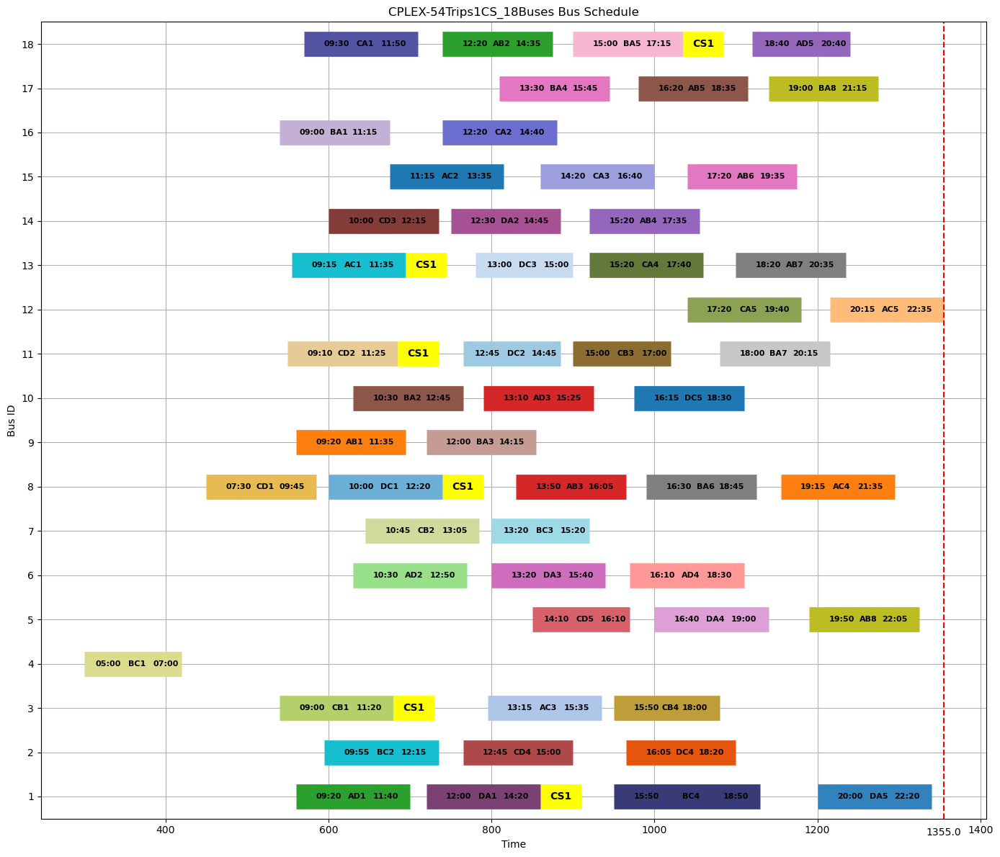

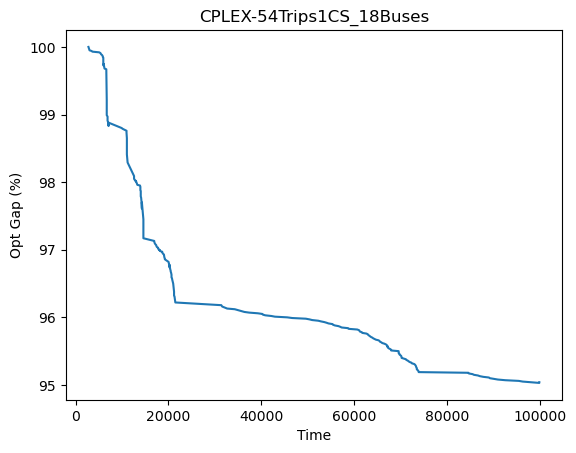

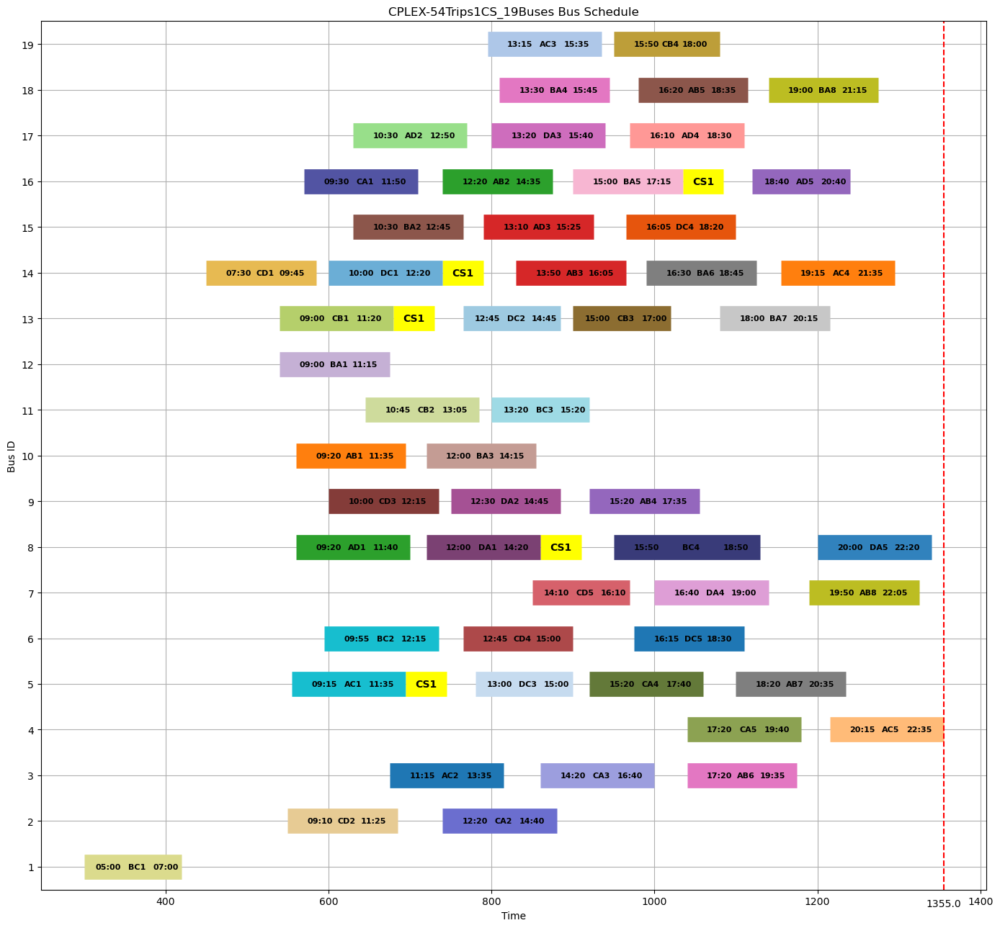

...

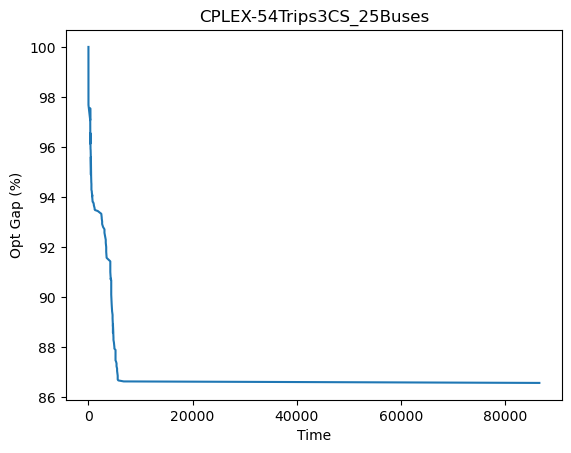

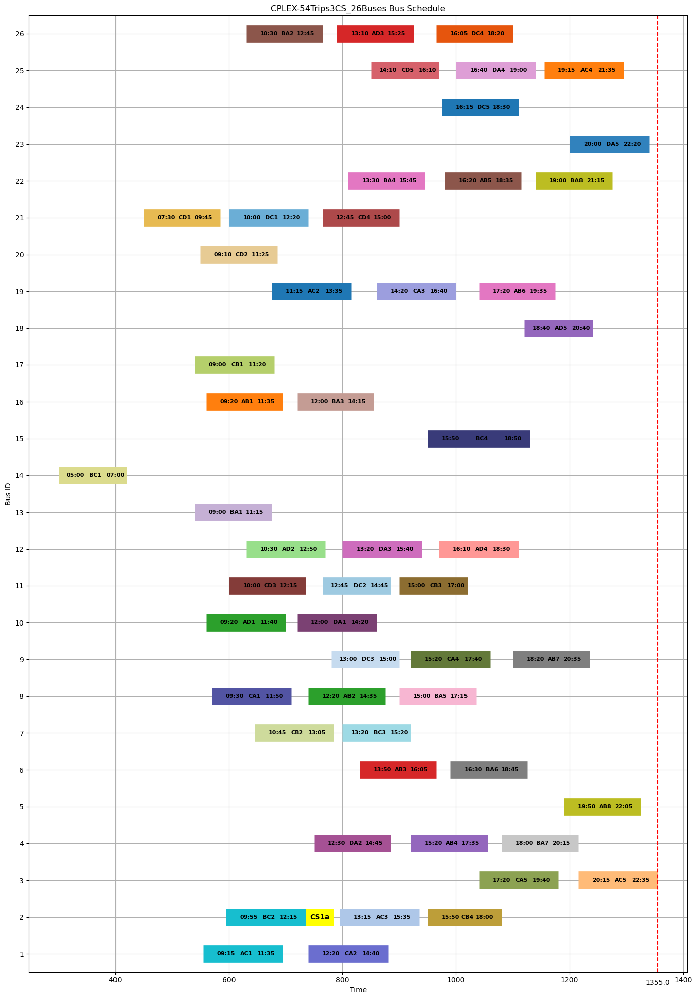

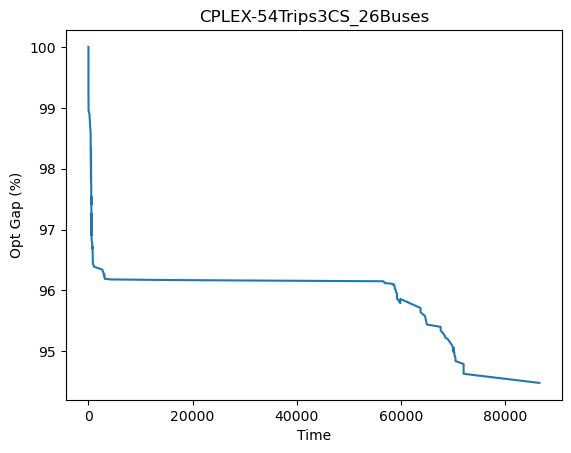

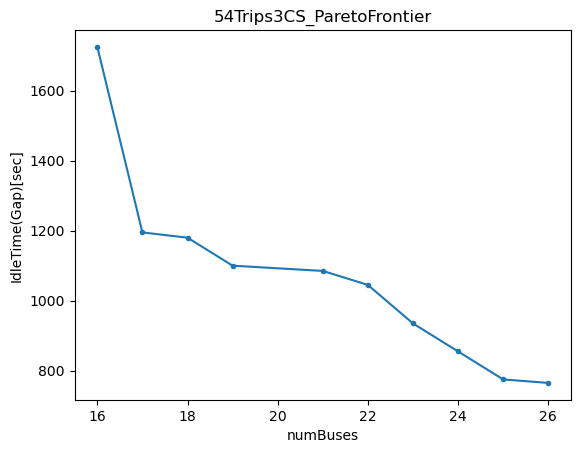

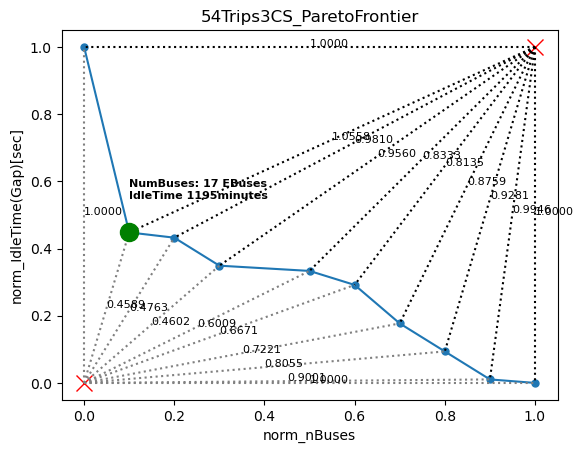

In [134]:

############################################### 54 TRIPS Single CS ###########################################
filename = f"{filepath}Data\\54Trips_3CS.xlsx"
sheetname = "54Trips"

NTrips = 54 #trips
NTerms = 4 #terminals
NCS = 1 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
df = pd.read_excel(filename, sheet_name="main", usecols="A:H", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="main", usecols="L:M", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="gamma", usecols="B:BD", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="delta", usecols="B:BE", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="phi", usecols="B:BD", nrows=(NTrips+DEPOT)*NCS)
df.rename(columns={'name':'trip_id', 'dep_term': 'dep_terminal', 'arr_term': 'arr_terminal'}, inplace=True)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
# print(cs_ids)

# ########## Time Limit Earliest ###################
# # soln_filename = f"{filepath}Results\\TimeLimit\\Hetro54TripsEVeh1CS_Earliest.txt"
# soln_filename = f"{filepath}Results\\TimeLimit\\1May25\\54TripsEVeh1CS_Eq1_58mins.txt"
# title = 'CPLEX-54Trips1CS'
# cplex_54Trips1cs_schedule, cplex_54Trips1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# ############### HPC Z Folder ###############
# soln_path = f"{filepath}Results\\HPC"
# soln_filename = f"{soln_path}\\RB_54T1CS.asc"
# title = 'CPLEX-54Trips1CS_Optimal'
# cplex_54Trips1cs_schedule_OPT, cplex_54Trips1cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 17
maxBuses = 27
cplex_pareto_54Trips1CS = []
num_buses = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\54T1CS{i}B_PF.asc"
    if not os.path.isfile(soln_filename):
        soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\54TripsEVeh1CS_{i}Buses.txt"
        if not os.path.isfile(soln_filename):
            continue
    print(f"soln = {soln_filename}")
    title = f'CPLEX-54Trips1CS_{i}Buses'
    cplex_1CS_schedule, cplex_1CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_54Trips1CS.append(cplex_1CS_schedule)

    ax = visualizeOptimization(soln_filename, title)
    num_buses.append(i)

cplex54T1CS_nbus = num_buses #[x for x in range(minBuses, maxBuses)]
cplex54T1CS_gap = []
for cplex_54T1CS in cplex_pareto_54Trips1CS:
    ###### 54Trips ##########
    cplex_54T1CS_df = cplex_54T1CS.copy(deep=True)
    cplex_54T1CS_df['next_dep'] = cplex_54T1CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_54T1CS_df['difference'] = cplex_54T1CS_df['next_dep'] - cplex_54T1CS_df['arr_time']
    cplex_54T1CS_df['difference'] = cplex_54T1CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_54T1CS_soln = cplex_54T1CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex54T1CS_gap.append(cplex_54T1CS_soln['gapTime'].sum())
cplex54T1CS_nbus = [16] + cplex54T1CS_nbus
cplex54T1CS_gap = [1920] + cplex54T1CS_gap
test = pd.DataFrame({"NumBuses[#]": cplex54T1CS_nbus, "IdleTime(Gap)[sec]": cplex54T1CS_gap})
title = f"54Trips1CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex54T1CS_norm = pareto_frontier(cplex54T1CS_gap, cplex54T1CS_nbus, title)

############################################### 54 TRIPS MULTIPLE CSs ###########################################
filename = f"{filepath}Data\\54Trips_3CS.xlsx"
sheetname = "54Trips"

NTrips = 54 #trips
NTerms = 4 #terminals
NCS = 3 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
df = pd.read_excel(filename, sheet_name="main", usecols="A:H", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="main", usecols="L:M", skiprows=10, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="gamma", usecols="B:BD", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="delta", usecols="B:BG", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="phi", usecols="B:BD", nrows=(NTrips+DEPOT)*NCS)
df.rename(columns={'name':'trip_id', 'dep_term': 'dep_terminal', 'arr_term': 'arr_terminal'}, inplace=True)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
# print(cs_ids)
# # soln_filename = f"{filepath}Results\\TimeLimit\\Hetro54TripsEVeh3CS_Earliest.txt"
# soln_filename = f"{filepath}Results\\TimeLimit\\1May25\\54TripsEVeh3CS_Eq1_53mins.txt"
# title = 'CPLEX-54Trips3CS'
# cplex_54Trips3cs_schedule, cplex_54Trips3cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# ############### HPC Z Folder ###############
# soln_path = f"{filepath}Results\\HPC"
# soln_filename = f"{soln_path}\\RB_54T3CS.asc"
# title = 'CPLEX-54Trips3CS_Optimal'
# cplex_54Trips3cs_schedule_OPT, cplex_54Trips3cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 17
maxBuses = 27
cplex_pareto_54Trips3CS = []
num_buses = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\54TripsEVeh3CS_{i}Buses.asc"
    if not os.path.isfile(soln_filename):
        soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\54TripsEVeh3CS_{i}Buses.txt"
        if not os.path.isfile(soln_filename):
            continue
    print(f"soln = {soln_filename}")
    title = f'CPLEX-54Trips3CS_{i}Buses'
    cplex_3CS_schedule, cplex_3CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
    cplex_pareto_54Trips3CS.append(cplex_3CS_schedule)

    ax = visualizeOptimization(soln_filename, title)
    num_buses.append(i)

cplex54T3CS_nbus = num_buses #[x for x in range(minBuses, maxBuses)]
cplex54T3CS_gap = []
for cplex_54T3CS in cplex_pareto_54Trips3CS:
    ###### 54Trips ##########
    cplex_54T3CS_df = cplex_54T3CS.copy(deep=True)
    cplex_54T3CS_df['next_dep'] = cplex_54T3CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_54T3CS_df['difference'] = cplex_54T3CS_df['next_dep'] - cplex_54T3CS_df['arr_time']
    cplex_54T3CS_df['difference'] = cplex_54T3CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_54T3CS_soln = cplex_54T3CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex54T3CS_gap.append(cplex_54T3CS_soln['gapTime'].sum())
cplex54T3CS_nbus = [16] + cplex54T3CS_nbus
cplex54T3CS_gap = [1725] + cplex54T3CS_gap
test = pd.DataFrame({"NumBuses[#]": cplex54T3CS_nbus, "IdleTime(Gap)[sec]": cplex54T3CS_gap})
title = f"54Trips3CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex54T3CS_norm = pareto_frontier(cplex54T3CS_gap, cplex54T3CS_nbus, title)

In [133]:
cplex54T1CS_norm

,NumBuses[#],IdleTime(Gap)[sec],Norm_NBuses,Norm_Gaps,dist_min,dist_max,dist_norm_min,dist_norm_max,slope
0,17,1375.0,0.000,1.000000,485.000000,8.000000,1.000000,1.000000,0.505208
1,18,1255.0,0.125,0.752577,365.001370,120.203993,0.762888,0.909309,0.733122
2,19,1185.0,0.250,0.608247,295.006780,190.094713,0.657621,0.846150,1.068155
3,20,1135.0,0.375,0.505155,245.018367,240.052078,0.629131,0.797181,1.212500
4,21,1085.0,0.500,0.402062,195.041021,290.027585,0.641602,0.779442,1.380903
5,22,1045.0,0.625,0.319588,155.080624,330.013636,0.701970,0.776908,1.436377
6,23,1000.0,0.750,0.226804,110.163515,375.005333,0.783543,0.812608,1.563740
7,24,965.0,0.875,0.154639,75.325958,410.001220,0.888560,0.854552,1.438203
8,25,890.0,1.000,0.000000,8.000000,485.000000,1.000000,1.000000,0.808333


In [130]:
cplex54T1CS_norm

,NumBuses[#],IdleTime(Gap)[sec],Norm_NBuses,Norm_Gaps,dist_min,dist_max,dist_norm_min,dist_norm_max,slope
0,16,1920.0,0.000000,1.000000,1030.000000,9.000000,1.000000,1.000000,0.209990
1,17,1375.0,0.111111,0.470874,485.001031,545.058712,0.483806,1.034455,0.819500
2,18,1255.0,0.222222,0.354369,365.005479,665.036841,0.418282,1.010830,1.383946
3,19,1185.0,0.333333,0.286408,295.015254,735.024489,0.439478,0.976554,2.016402
4,20,1135.0,0.444444,0.237864,245.032651,785.015923,0.504093,0.943129,2.288889
5,21,1085.0,0.555556,0.189320,195.064092,835.009581,0.586928,0.924517,2.606790
6,22,1045.0,0.666667,0.150485,155.116086,875.005143,0.683440,0.912571,2.711511
7,23,1000.0,0.777778,0.106796,110.222502,920.002174,0.785076,0.920432,2.951940
8,24,965.0,0.888889,0.072816,75.425460,955.000524,0.891866,0.933818,2.714959
9,25,890.0,1.000000,0.000000,9.000000,1030.000000,1.000000,1.000000,1.525926


In [135]:
cplex54T3CS_norm

,NumBuses[#],IdleTime(Gap)[sec],Norm_NBuses,Norm_Gaps,dist_min,dist_max,dist_norm_min,dist_norm_max,slope
0,16,1725.0,0.0,1.000000,960.000000,10.000000,1.000000,1.000000,0.181132
1,17,1195.0,0.1,0.447917,430.001163,530.076410,0.458944,1.055839,6.228838
2,18,1180.0,0.2,0.432292,415.004819,545.058712,0.476315,0.980965,5.578947
3,19,1100.0,0.3,0.348958,335.013433,625.039199,0.460187,0.955958,10.968421
4,21,1085.0,0.5,0.333333,320.039060,640.019531,0.600925,0.833333,9.963636
5,22,1045.0,0.6,0.291667,280.064278,680.011765,0.667135,0.813472,1.992727
6,23,935.0,0.7,0.177083,170.144057,790.005696,0.722052,0.875895,1.062201
7,24,855.0,0.8,0.093750,90.354856,870.002299,0.805474,0.928057,1.200000
8,25,775.0,0.9,0.010417,13.453624,950.000526,0.900060,0.994623,8.666667
9,26,765.0,1.0,0.000000,10.000000,960.000000,1.000000,1.000000,9.600000


In [63]:
cplex100T3CS_norm

,NumBuses[#],IdleTime(Gap)[sec],Norm_NBuses,Norm_Gaps,dist_min,dist_max,dist_norm_min,dist_norm_max,slope
0,31,2528.0,0.0,1.000000,568.000000,5.000000,1.000000,1.000000,0.507143
1,32,2304.0,0.2,0.605634,344.001453,224.035711,0.637803,0.891922,0.537729
2,33,2103.0,0.4,0.251761,143.013985,425.010588,0.472635,0.959094,1.024530
3,34,2011.0,0.6,0.089789,51.088159,517.003868,0.606681,0.994226,2.413252
4,35,1972.0,0.8,0.021127,12.649111,556.000899,0.800279,0.999096,7.924585
5,36,1960.0,1.0,0.000000,5.000000,568.000000,1.000000,1.000000,9.466667


In [62]:
print(find_best(cplex54T1CS_norm))
print(find_best(cplex54T3CS_norm))

print(cplex54T1CS_norm)
print(cplex54T3CS_norm)

NumBuses[#]             19.000000
IdleTime(Gap)[sec]    1185.000000
Norm_NBuses              0.250000
Norm_Gaps                0.608247
dist_min               295.006780
dist_max               190.094713
dist_norm_min            0.657621
dist_norm_max            0.846150
slope                    1.068155
Name: 2, dtype: float64
NumBuses[#]            26.000000
IdleTime(Gap)[sec]    765.000000
Norm_NBuses             1.000000
Norm_Gaps               0.000000
dist_min                9.000000
dist_max              430.000000
dist_norm_min           1.000000
dist_norm_max           1.000000
slope                   4.777778
Name: 9, dtype: float64
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0           17              1375.0        0.000   1.000000  485.000000   
1           18              1255.0        0.125   0.752577  365.001370   
2           19              1185.0        0.250   0.608247  295.006780   
3           20              1135.0        0.375   0.5

soln = .\\MIP-Results\TimeLimit\FINAL\100T1CS30B_PF.asc
          ID   type  duration  dep_time  arr_time dep_terminal arr_terminal
trip_id                                                                    
DEPOT      1  depot         0         0      1440            -            -
AB1        2   trip       135       430       565   Terminal A   Terminal B
AB2        3   trip       135       560       695   Terminal A   Terminal B
AB3        4   trip       135       720       855   Terminal A   Terminal B
AB4        5   trip       135       740       875   Terminal A   Terminal B
...      ...    ...       ...       ...       ...          ...          ...
DC7       98   trip        70       590       660   Terminal D   Terminal C
DC8       99   trip        80       780       860   Terminal D   Terminal C
DC9      100   trip        95       965      1060   Terminal D   Terminal C
DC10     101   trip        85      1005      1090   Terminal D   Terminal C
CS1      102     cs        50   

cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
soln = .\\MIP-Results\TimeLimit\FINAL\100T1CS33B_PF.asc
          ID   type  duration  dep_time  arr_time dep_terminal arr_terminal
trip_id                                                                    
DEPOT      1  depot         0         0      1440            -            -
AB1        2   trip       135       430       565   Terminal A   Terminal B
AB2        3   trip       135       560       695   Terminal A   Terminal B
AB3        4   trip       135       720       855   Terminal A   Terminal B
AB4        5   trip       135       740       875   Terminal A   Terminal B
...      ...    ...       ...       ...       ...          ...          ...
DC7       98   trip        70       590       660   Terminal D   Terminal C
DC8       99   trip        80      

cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
SLOPE = 
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0           30              2664.0     0.000000   1.000000  491.000000   
1           31              2660.0     0.166667   0.991853  487.001027   
2           32              2509.0     0.333333   0.684318  336.005952   
3           33              2424.0     0.500000   0.511202  251.017928   
4           35              2245.0     0.833333   0.146640   72.173402   

     dist_max  dist_norm_min  dist_norm_max      slope  
0    6.000000       1.000000       1.000000  20.458333  
1    6.403124       1.005759       0.833373  19.944362  
2  155.051604       0.761185       0.737631   0.811185  
3  240.018749       0.715071       0.699231   0.947160  
4  419.001193       0.846137       0.869484   1.072825  
33.0
0.5


C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


soln = .\\MIP-Results\TimeLimit\FINAL\100T3CS31B_PF.asc
{'0': ['CB3', 'BC3', 'CA10', 'AD5'], '1': ['CA8', 'AD4'], '10': ['AC4', 'CD10'], '11': ['BA2', 'AD3', 'DC5', 'CS1', 'CA9'], '12': ['AD7', 'AB3'], '13': ['CB5', 'BA1', 'AD8', 'CS1', 'DC4', 'CD9', 'DA5'], '14': ['AB5', 'BA6', 'AB10'], '15': ['BC9', 'DA8', 'AD9'], '16': ['CD3', 'DA2', 'AC7'], '17': ['BC7', 'CA5', 'AC10'], '18': ['AC1', 'CS1a', 'AC5', 'BC4'], '19': ['AB1', 'BC2', 'CB10'], '2': ['BA9', 'AC3', 'CB7', 'CS1', 'DA9', 'AD10'], '20': ['AD1', 'DA1', 'CS1a', 'AB6', 'BA7'], '21': ['AC2', 'CA2'], '22': ['CA7', 'CB8'], '23': ['DC7', 'CS1', 'BC8', 'CA3', 'AB8', 'BA10'], '24': ['CD1', 'DC1', 'CD4'], '25': ['BA4', 'AB7', 'BA8'], '26': ['CB1', 'BC5', 'CB2', 'CS1', 'CB9', 'DC9'], '27': ['CD2', 'CS1', 'DC3', 'CA4', 'AB9'], '28': ['CD5', 'DC10'], '29': ['DC6', 'BC10'], '3': ['CB6', 'DA3', 'CS1a', 'AC8', 'DA10'], '30': ['CA1', 'AB4', 'BA5'], '4': ['BC1', 'CD7', 'DA7', 'AC6'], '5': ['BC6', 'CA6', 'CS1', 'DC8', 'CD8', 'DA4', 'AC9'], '6': [

C:\Users\gozalid\OneDrive - Queensland University of Technology\Sentosa_DSG\Research\Thesis\Codes\8_Deterministic_Scheduling\eRoSB_Final\CPLEX-MIP\cplex_visualizer.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,1, figsize=(12, int(len(buses)/2) + 2)) if len(trips) < 30 else plt.subplots(1,1, figsize=(12, len(buses)-3)) if len(trips) < 40 else plt.subplots(1,1, figsize=(14, len(buses)-6))


cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
cs!!! dur = 50
soln = .\\MIP-Results\TimeLimit\FINAL\100T3CS35B_PF.asc
{'0': ['CB1', 'BC1', 'CD7', 'DA7'], '1': ['AC1', 'CS1a', 'AC5'], '10': ['CD2', 'CS1', 'DC2', 'CB4'], '11': ['BA2', 'AD3', 'DC9', 'CS1a', 'AD5'], '12': ['CB3', 'BC3', 'CS1a', 'AB7', 'BA8'], '13': ['DC3', 'CA4', 'AB9'], '14': ['DA3', 'CA10'], '15': ['CA1', 'AD8'], '16': ['CB5', 'BA1'], '17': ['CB8', 'AD9'], '18': ['DC7', 'CS1', 'BC8', 'CA3', 'AB8', 'BA10'], '19': ['CD5', 'DA4', 'AC9'], '2': ['AC2', 'CA2', 'CS1', 'DC4', 'CD9', 'DA10'], '20': ['AB5', 'BA6', 'CS1a', 'AC10'], '21': ['AB1', 'BC2', 'CB10'], '22': ['AD7'], '23': ['CD3', 'DA2', 'AC7'], '24': ['CA7', 'AC6'], '25': ['BC9', 'CS1', 'DC8'], '26': ['BA9', 'AC3', 'CB7', 'CS1', 'DA9', 'AD10'], '27': ['AD1', 'DA1'], '28': ['AD6'], '29': ['CA8', 'AD4', 'DA5'], '3': ['DC6'], '30': ['CB6', 'BC10', 'CD8', 'DC10'], '31': ['DA8', 'AB6', 'BA7

C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:45: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "bo" (-> color='b'). The keyword argument will take precedence.
  ax.plot(best['Norm_NBuses'], best['Norm_Gaps'], 'bo', color="green", markersize=13)
C:\Users\gozalid\AppData\Local\Temp\ipykernel_17396\3505415901.py:50: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


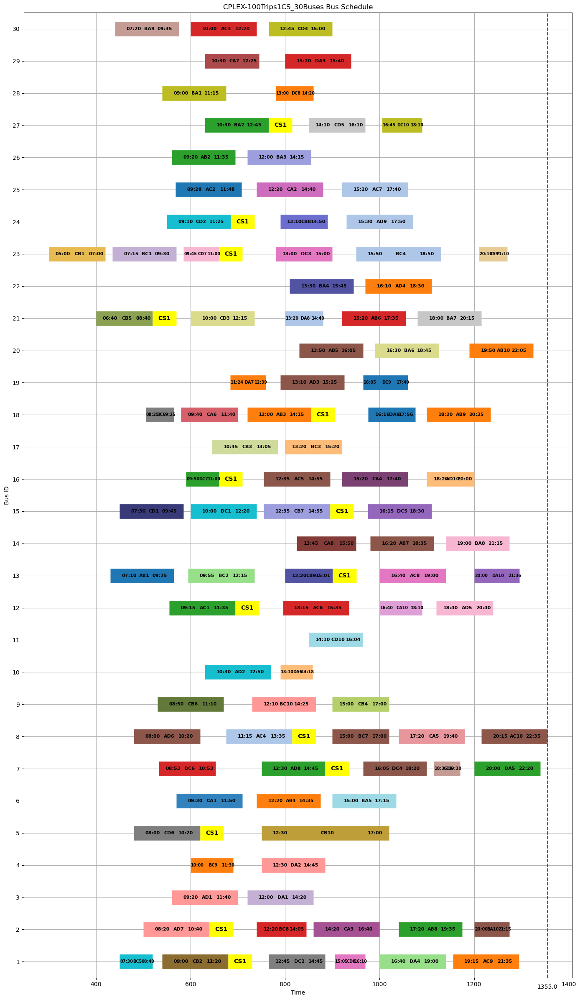

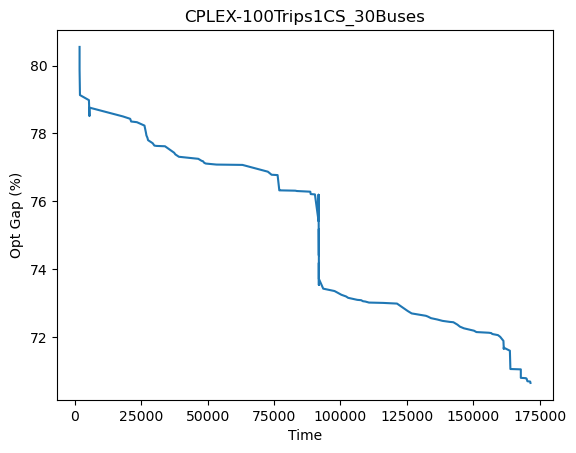

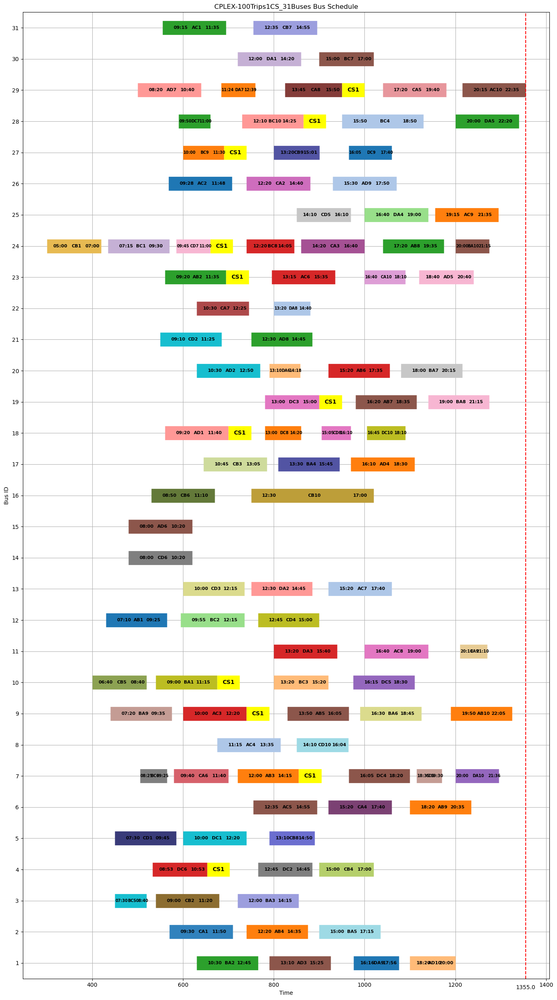

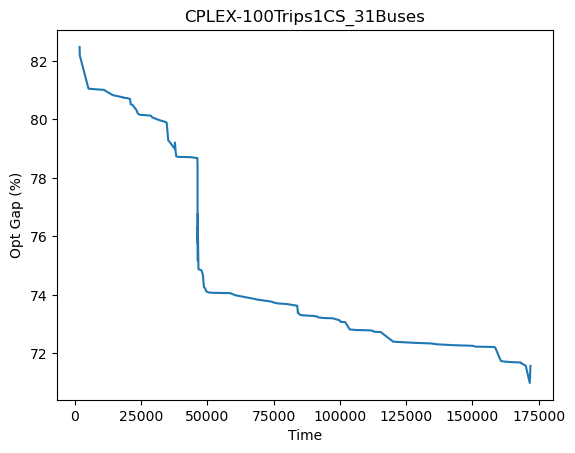

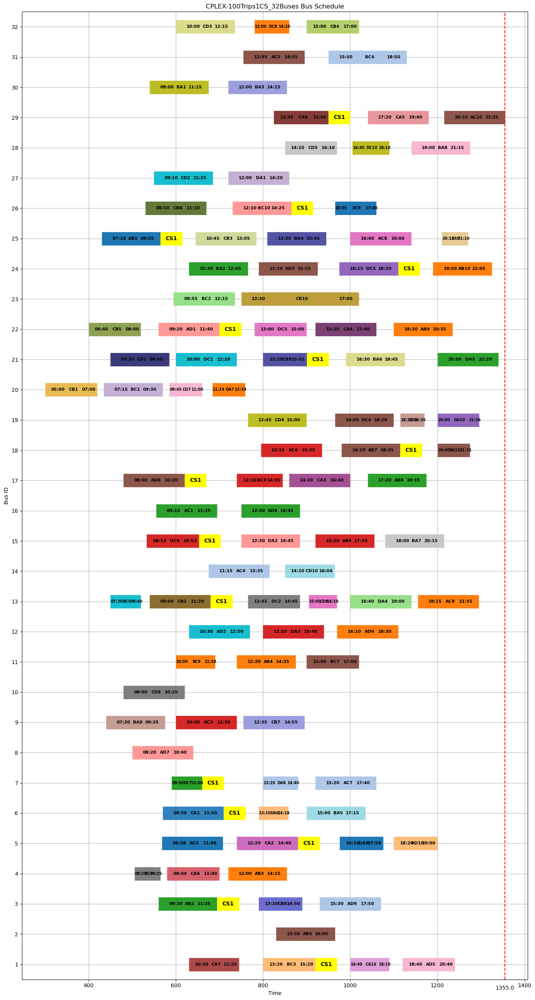

...

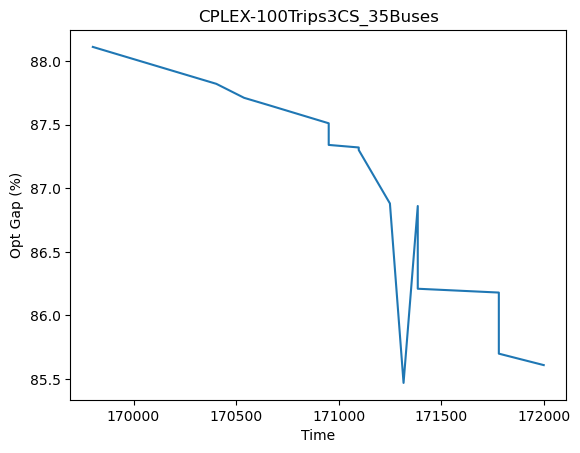

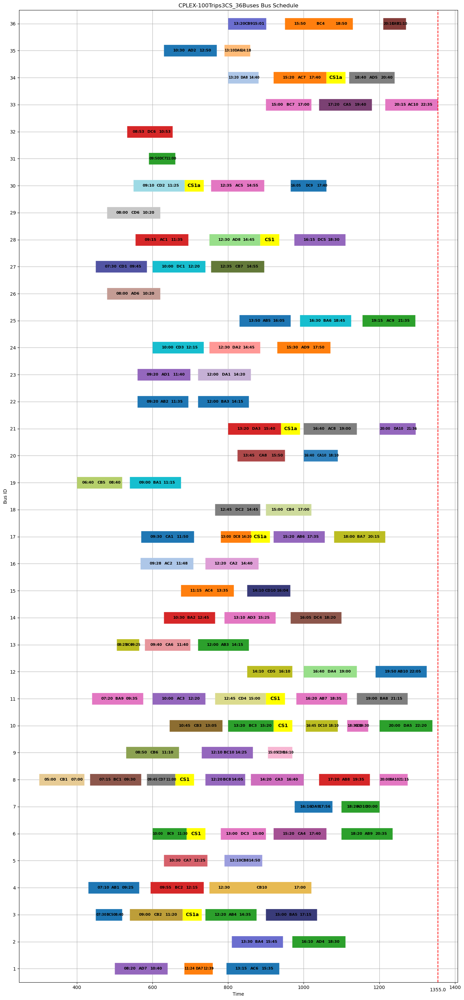

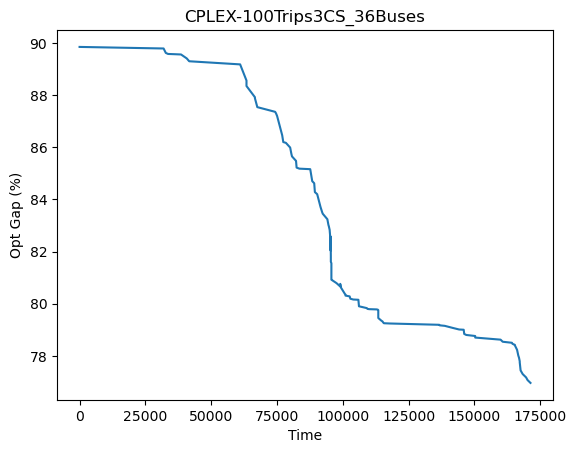

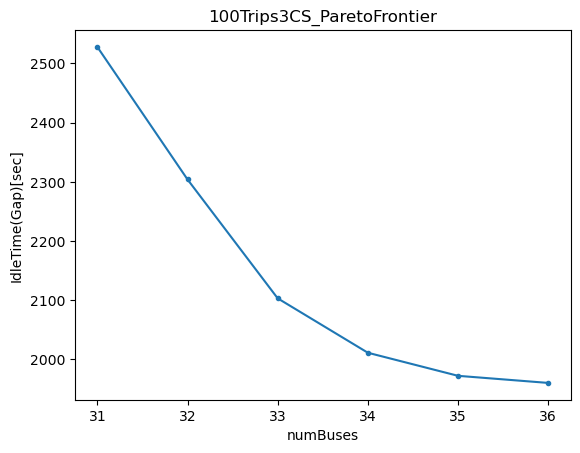

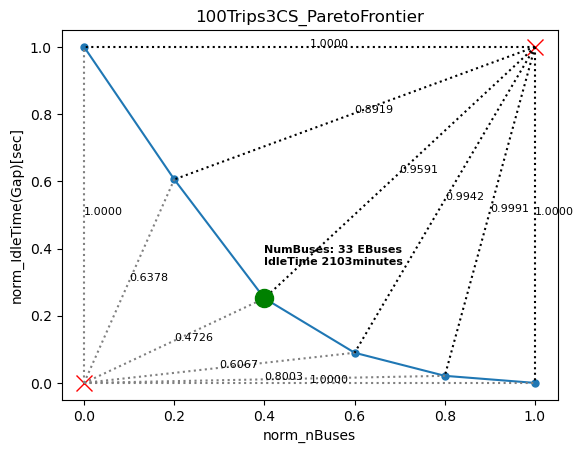

In [55]:
############################################### 100 TRIPS Single CS ###########################################
filename = f"{filepath}Data\\trip100cs1.xlsx"
sheetname = "main"

NTrips = 100 #trips
NTerms = 4 #terminals
NCS = 1 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
df = pd.read_excel(filename, sheet_name="main", usecols="A:H", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="main", usecols="L:M", skiprows=19, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="gamma", usecols="B:CX", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="delta", usecols="B:CY", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="phi", usecols="B:CX", nrows=(NTrips+DEPOT)*NCS)
df.rename(columns={'name':'trip_id', 'dep_term': 'dep_terminal', 'arr_term': 'arr_terminal'}, inplace=True)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()
# print(cs_ids)

# ########## Time Limit Earliest ###################
# # soln_filename = f"{filepath}Results\\TimeLimit\\Hetro54TripsEVeh1CS_Earliest.txt"
# soln_filename = f"{filepath}Results\\TimeLimit\\1May25\\54TripsEVeh1CS_Eq1_58mins.txt"
# title = 'CPLEX-54Trips1CS'
# cplex_54Trips1cs_schedule, cplex_54Trips1cs_fig = load_data_hyperparameter(df2, title, soln_filename, R)

# ############### HPC Z Folder ###############
# soln_path = f"{filepath}Results\\HPC"
# soln_filename = f"{soln_path}\\RB_54T1CS.asc"
# title = 'CPLEX-54Trips1CS_Optimal'
# cplex_54Trips1cs_schedule_OPT, cplex_54Trips1cs_fig_OPT = load_data_hyperparameter(df2, title, soln_filename, R)

minBuses = 30
maxBuses = 37
cplex_pareto_100Trips1CS = []
num_buses = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\100T1CS{i}B_PF.asc"
    if not os.path.isfile(soln_filename):
        pass
    else:
        print(f"soln = {soln_filename}")
        title = f'CPLEX-100Trips1CS_{i}Buses'
        print(df2)
        cplex_1CS_schedule, cplex_1CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
        cplex_pareto_100Trips1CS.append(cplex_1CS_schedule)

        ax = visualizeOptimization(soln_filename, title)
        num_buses.append(i)

cplex100T1CS_nbus = num_buses #[x for x in range(minBuses, maxBuses)]
cplex100T1CS_gap = []
for cplex_100T1CS in cplex_pareto_100Trips1CS:
    ###### 54Trips ##########
    cplex_100T1CS_df = cplex_100T1CS.copy(deep=True)
    cplex_100T1CS_df['next_dep'] = cplex_100T1CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_100T1CS_df['difference'] = cplex_100T1CS_df['next_dep'] - cplex_100T1CS_df['arr_time']
    cplex_100T1CS_df['difference'] = cplex_100T1CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_100T1CS_soln = cplex_100T1CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex100T1CS_gap.append(cplex_100T1CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex100T1CS_nbus, "IdleTime(Gap)[sec]": cplex100T1CS_gap})
title = f"100Trips1CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-")
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex100T1CS_norm = pareto_frontier(cplex100T1CS_gap, cplex100T1CS_nbus, title)
############################################### 100 TRIPS MULTIPLE CSs ###########################################
filename = f"{filepath}Data\\trip100cs3.xlsx"
sheetname = "main"

NTrips = 100 #trips
NTerms = 4 #terminals
NCS = 3 #recharging stations
CHARGING_TIME = 100 #minutes
NRechargeCycle = 3 #cycle
D_MAX = 350 #minutes of operation
DEPOT = 1 #depot
df = pd.read_excel(filename, sheet_name="main", usecols="A:H", nrows=NTrips+NCS+DEPOT)
term = pd.read_excel(filename, sheet_name="main", usecols="L:M", skiprows=19, nrows=NTerms)
gamma = pd.read_excel(filename, sheet_name="gamma", usecols="B:CX", nrows=NTrips+DEPOT)
delta = pd.read_excel(filename, sheet_name="delta", usecols="B:DA", nrows=NTrips+DEPOT+NCS)
phi = pd.read_excel(filename, sheet_name="phi", usecols="B:CX", nrows=(NTrips+DEPOT)*NCS)
df.rename(columns={'name':'trip_id', 'dep_term': 'dep_terminal', 'arr_term': 'arr_terminal'}, inplace=True)
df2 = df.set_index('trip_id')
gamma = gamma.to_numpy()
delta = delta.to_numpy()
phi = phi.to_numpy()

trips_df = df.copy()
s = len(trips_df)
k = (s // 2) - 2
D_MAX = 350

K = [i for i in range(1, k+1)]
# print(f"K = {K}")
Sprime = [i for i in range(s)]
# print(f"Sprime = {Sprime}")
S = Sprime[:-NCS]
# print(f"S = {S}")
S1 = S[1:]
# print(f"S1 = {S1}")
R = Sprime[-NCS:]
# print(f"R = {R}")
# print(f"Expected number of buses = {k} -> {K}\nNumber of available schedules {s} -> {Sprime}\n")
durations = trips_df.duration.to_list()
C = [i for i in range(1, NRechargeCycle+1)]
# print(C)
df2['ID'] = range(1, len(df2)+1)
cs_ids = df2.loc[df2.ID.isin(R)].index.to_list()

minBuses = 31
maxBuses = 37
cplex_pareto_100Trips3CS = []
num_buses = []
for i in range(minBuses, maxBuses):
    soln_filename = f"{filepath}Results\\TimeLimit\\FINAL\\100T3CS{i}B_PF.asc"
    if not os.path.isfile(soln_filename):
        pass
    else:
        print(f"soln = {soln_filename}")
        title = f'CPLEX-100Trips3CS_{i}Buses'
        cplex_3CS_schedule, cplex_3CS_fig = load_data_hyperparameter(df2, title, soln_filename, R)
        cplex_pareto_100Trips3CS.append(cplex_3CS_schedule)
        num_buses.append(i)

        ax = visualizeOptimization(soln_filename, title)

cplex100T3CS_nbus = num_buses #[x for x in range(minBuses, maxBuses)]
cplex100T3CS_gap = []
for cplex_100T3CS in cplex_pareto_100Trips3CS:
    ###### 54Trips ##########
    cplex_100T3CS_df = cplex_100T3CS.copy(deep=True)
    cplex_100T3CS_df['next_dep'] = cplex_100T3CS_df.groupby('bus_id')['dep_time'].shift(-1).fillna(0)
    cplex_100T3CS_df['difference'] = cplex_100T3CS_df['next_dep'] - cplex_100T3CS_df['arr_time']
    cplex_100T3CS_df['difference'] = cplex_100T3CS_df['difference'].apply(lambda x: 0 if x < 0 else x)
    cplex_100T3CS_soln = cplex_100T3CS_df.groupby(['bus_id']).agg(
        trips=('trip_id', concat_str),
        numRecharge=('trip_id',countRecharge),
        numTrips=('trip_id', countTrips),
        gapTime=('difference', 'sum')
    )
    cplex100T3CS_gap.append(cplex_100T3CS_soln['gapTime'].sum())

test = pd.DataFrame({"NumBuses[#]": cplex100T3CS_nbus, "IdleTime(Gap)[sec]": cplex100T3CS_gap})
title = f"100Trips3CS_ParetoFrontier"
ax = test.sort_values(by=['NumBuses[#]']).plot(
    x='NumBuses[#]', 
    y='IdleTime(Gap)[sec]', 
    xlabel="numBuses", 
    ylabel="IdleTime(Gap)[sec]", 
    legend=False, 
    title=title, 
    style=".-"
)
# Set integer x-axis ticks only
ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
fig = ax.get_figure()
fig.savefig(f"{saveFigDir}MIP-ParetoFront-{NTrips}T{NCS}CS")
cplex100T3CS_norm = pareto_frontier(cplex100T3CS_gap, cplex100T3CS_nbus, title)

In [56]:
print(find_best(cplex100T1CS_norm))
print(find_best(cplex100T3CS_norm))

print(cplex100T1CS_norm)
print(cplex100T3CS_norm)

NumBuses[#]             30.000000
IdleTime(Gap)[sec]    2664.000000
Norm_NBuses              0.000000
Norm_Gaps                1.000000
dist_min               491.000000
dist_max                 6.000000
dist_norm_min            1.000000
dist_norm_max            1.000000
slope                   20.458333
Name: 0, dtype: float64
NumBuses[#]             34.000000
IdleTime(Gap)[sec]    2011.000000
Norm_NBuses              0.600000
Norm_Gaps                0.089789
dist_min                51.088159
dist_max               517.003868
dist_norm_min            0.606681
dist_norm_max            0.994226
slope                    2.413252
Name: 3, dtype: float64
   NumBuses[#]  IdleTime(Gap)[sec]  Norm_NBuses  Norm_Gaps    dist_min  \
0           30              2664.0     0.000000   1.000000  491.000000   
1           31              2660.0     0.166667   0.991853  487.001027   
2           32              2509.0     0.333333   0.684318  336.005952   
3           33              2424.0     0.500